In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from Pipelines import *

matplotlib.rcParams['font.family'] = 'Arial'
plt.style.use('seaborn-v0_8-talk')

annot = pd.read_table("./Data/GECODEv49_Annot.tsv", index_col=0)
palangodb = pd.read_table("./Data/PalangoDB_CellTypeMarkers.tsv")

In [2]:
meta = pd.read_csv("/project/cfRNA_Disentaglement/Data/RPM/RPM_Lab/Meta.csv", index_col=0)
counts = pd.read_csv("/project/cfRNA_Disentaglement/Data/RPM/RPM_Lab/RPM10_12_13_14_16_raw.csv", index_col=0)
counts_seq15 = pd.read_csv("/project/cfRNA_Disentaglement/Data/RPM/Compgen_Lab/Seq15.csv", index_col=0).astype(int)

counts = pd.merge(counts, counts_seq15, left_index=True, right_index=True).sort_index(axis=1)
counts = counts.sort_index(axis=1)

qc = pd.read_csv("/project/cfRNA_Disentaglement/Data/RPM/RPM_Lab/RPM10_12_13_14_16_stats.csv", index_col=0)
qc_seq15 = pd.read_csv("/project/cfRNA_Disentaglement/Data/RPM/Compgen_Lab/Seq15_qc.csv", index_col=0).T
qc_merged = pd.concat((qc, qc_seq15), axis=0).dropna(axis=1)
adata = sc.AnnData(counts.T)
adata.obs = adata.obs.merge(qc_merged, left_index=True, right_index=True, how='left')
adata.obs = adata.obs.merge(meta, left_index=True, right_index=True, how='left')
adata.var = adata.var.merge(annot, left_index=True, right_index=True, how='left')
platelet_sigs = palangodb[palangodb['cell type'] == 'Platelets']
adata.var['is_platelet'] = False
adata.var.loc[adata.var['GeneName'].isin(platelet_sigs['official gene symbol']), 'is_platelet'] = True
adata.var['log10_Length'] = np.log10(adata.var['Length'])
adata.obs['Batch_Granular'] = adata.obs['Sample source'].astype(str) + "-" + adata.obs['Seq_ID'].astype(str) + "-" + adata.obs['Batch_tube'].astype(str) + "-" + adata.obs['Batch_centrifuge'].astype(str) + "-" + adata.obs['Batch_RNAext'].astype(str)

mask = (adata.obs['Subtype'].astype(str) == adata.obs['Type'].astype(str)) | (adata.obs['Subtype'] == '(NA)')
adata.obs.loc[mask, 'Subtype'] = None

adata.obs['Responder'] = adata.obs['Responder'].replace(0, "ICI-Nonresponder").replace(1, "ICI-Responder")
cols = ['Type', 'Subtype', 'Responder']
adata.obs['Type_Granular'] = adata.obs[cols].apply(
    lambda row: '_'.join(row.dropna().astype(str)), axis=1
)
if 'raw_counts' not in adata.layers:
    adata.layers['raw_counts'] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)
sc.pp.filter_genes(adata, min_cells=1)

## For RPM Data (CPM + log1p Normazliation)

In [66]:
pipeline = RNASeqQCPipeline(
    adata=adata,              
    gene_type_col='GeneType',       # adata.var에 있는 유전자 타입 컬럼명
    target_types=['protein_coding'], # 분석 대상 유전자
    phenotype_col='Type',           # adata.obs에 있는 Phenotype(질병/정상 등) 컬럼
    batch_col='Batch_Granular',                # adata.obs에 있는 Batch(시퀀싱 차수 등) 컬럼
    gc_col='GC_Percent',            # adata.var에 있는 GC 함량 컬럼
    len_col='Length',               # adata.var에 있는 유전자 길이 컬럼
    platelet_col='is_platelet'      # adata.var에 있는 혈소판 유전자 마커 컬럼 (True/False)
)
pipeline.prepare_data()
pipeline.calculate_bias_metrics(is_original=True) # 여기서 'orig_...' 생성

--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19604 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.


--- [Step 2-1] Scree Plot & Bias Heatmap ---


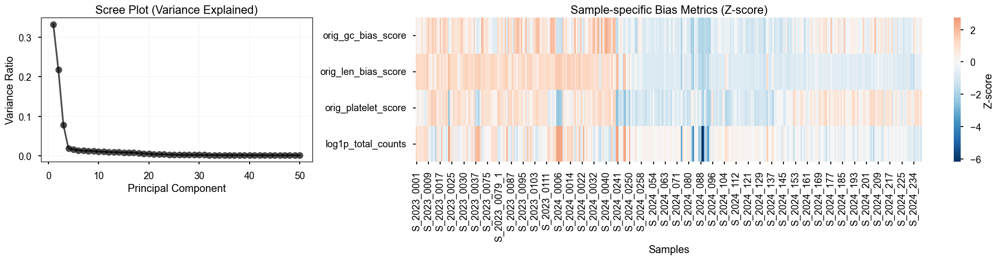

--- [Step 2-2] PCA Scatter Plots ---


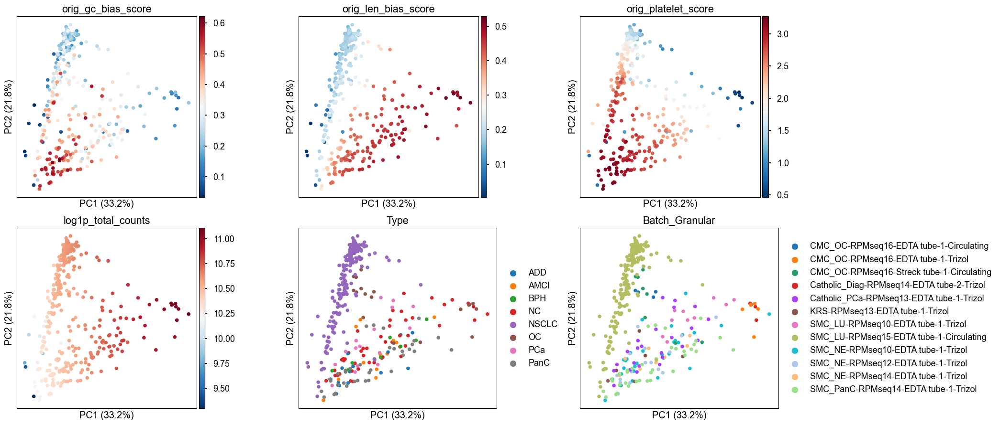

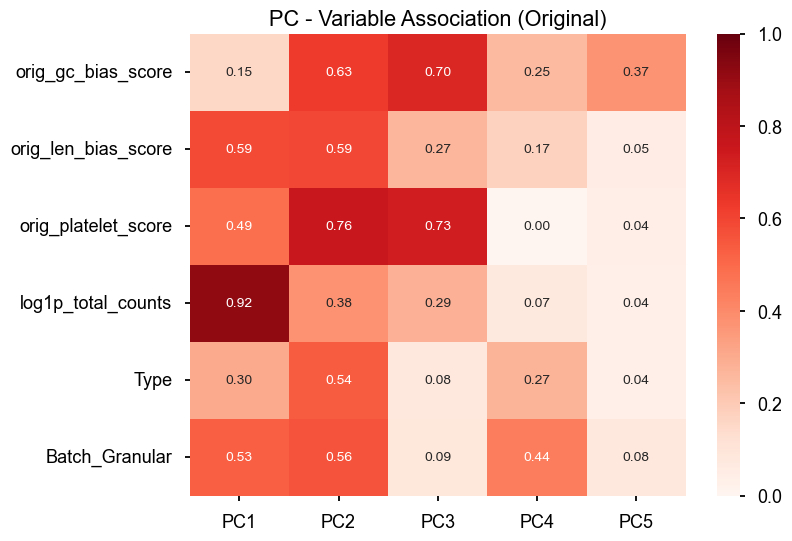

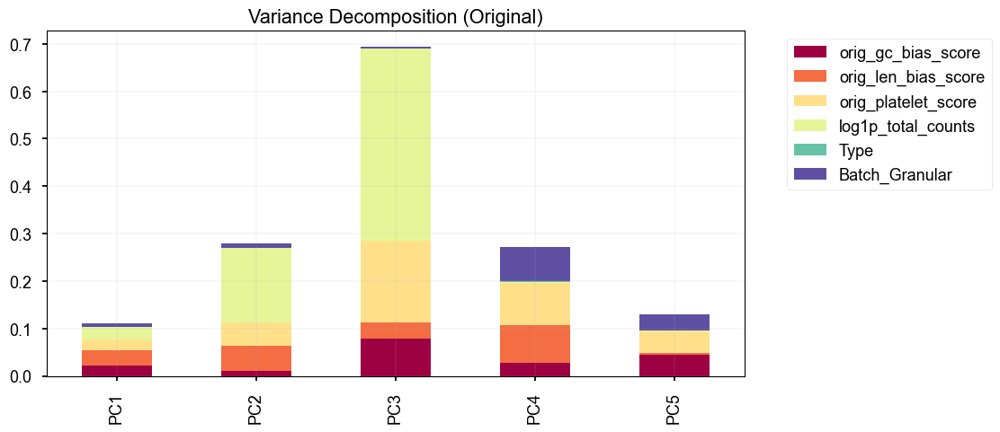

--- [Step 6] Partial Correlation Analysis (Original) ---


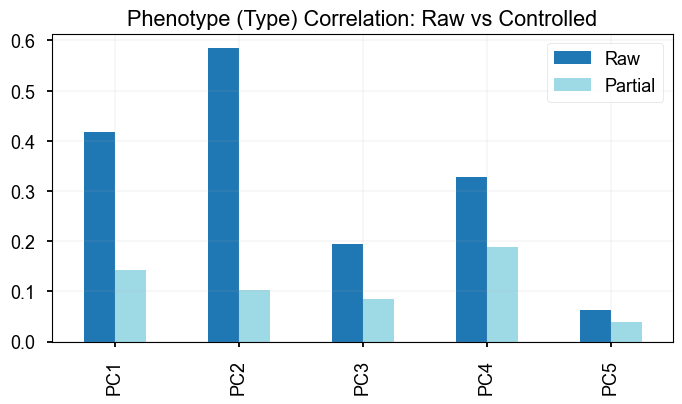

--- [Step 8] Cascade Correction Analysis (Batch Method: REGRESSION) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Regressing out: ['Batch_Granular']


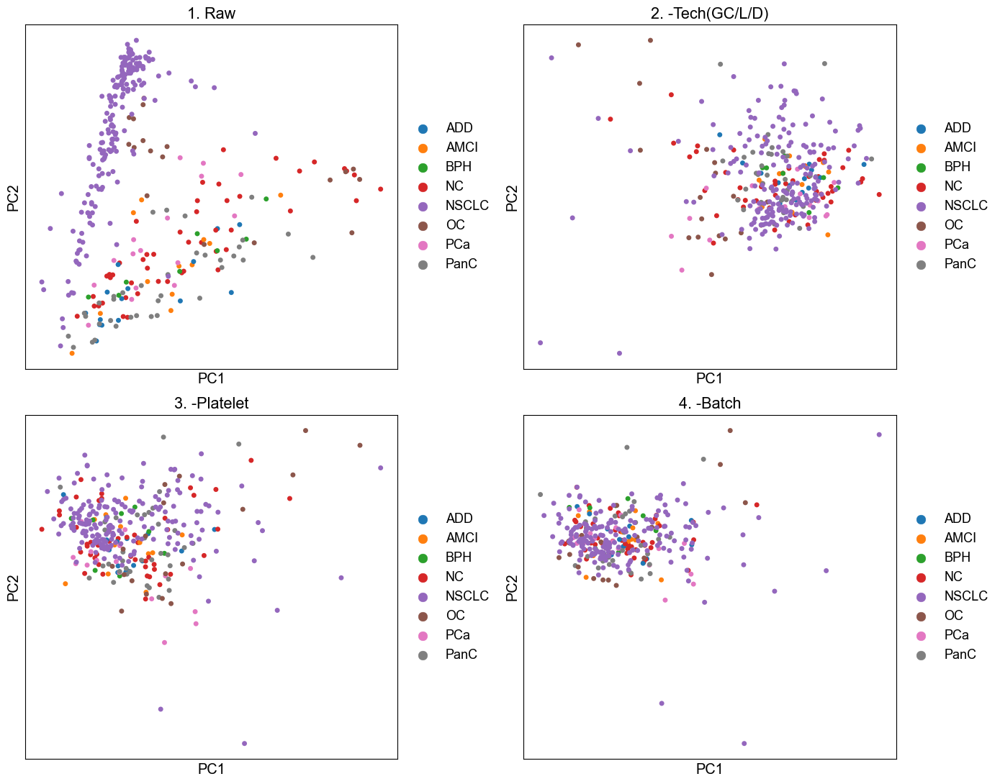

Displaying Metric Evolution (Spearman/ANOVA)...


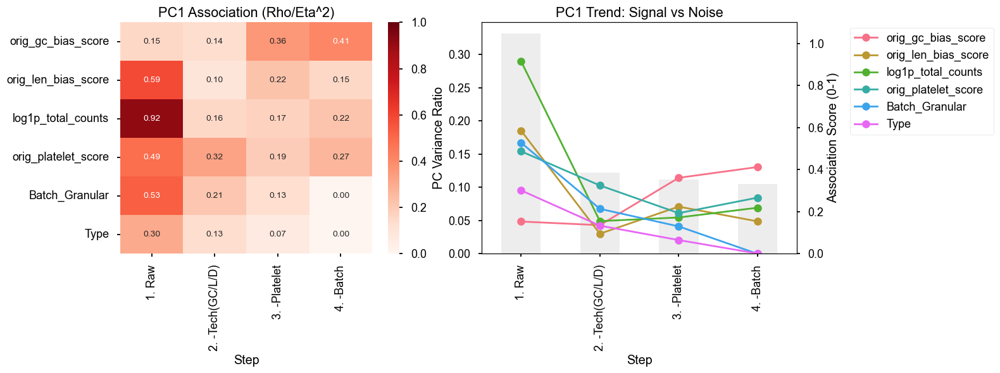

In [54]:
pipeline.run_pca_diagnostics(use_original_metrics=True) # 원본 바이어스 투영
pipeline.analyze_pc_associations(use_original_metrics=True)
pipeline.analyze_variance_decomposition(use_original_metrics=True)
pipeline.analyze_partial_correlation(use_original_metrics=True) # 포함됨
pipeline.run_cascade_analysis(batch_method='regression')

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


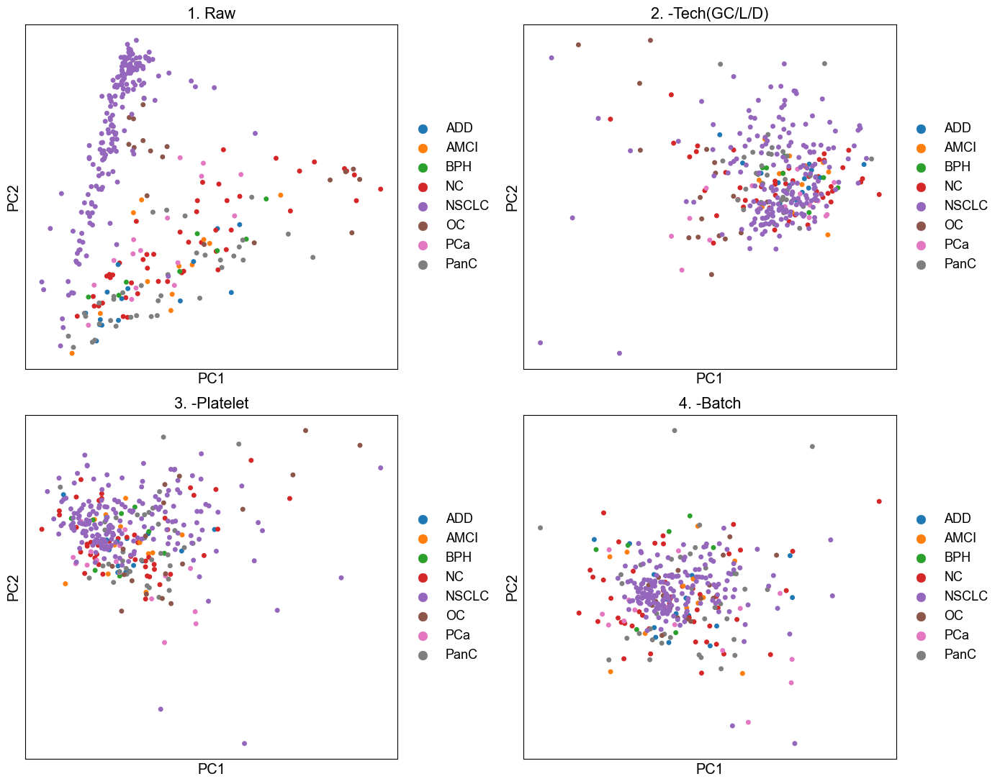

Displaying Metric Evolution (Spearman/ANOVA)...


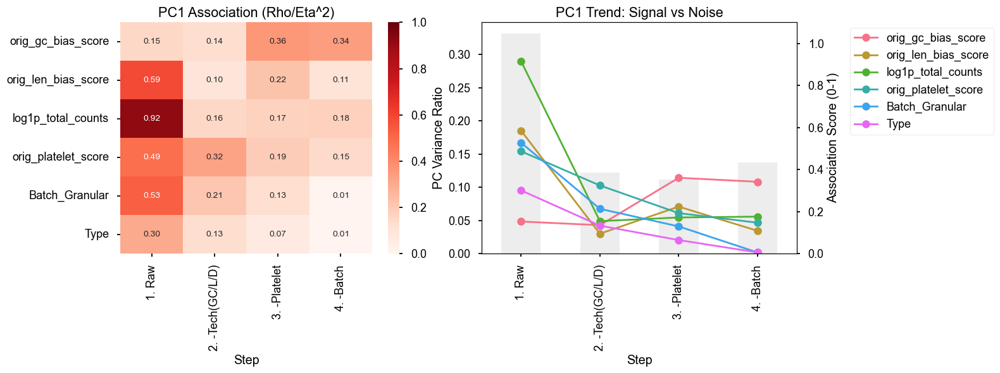

In [55]:
pipeline.run_cascade_analysis(batch_method='combat')

### Draw Bias Patterns

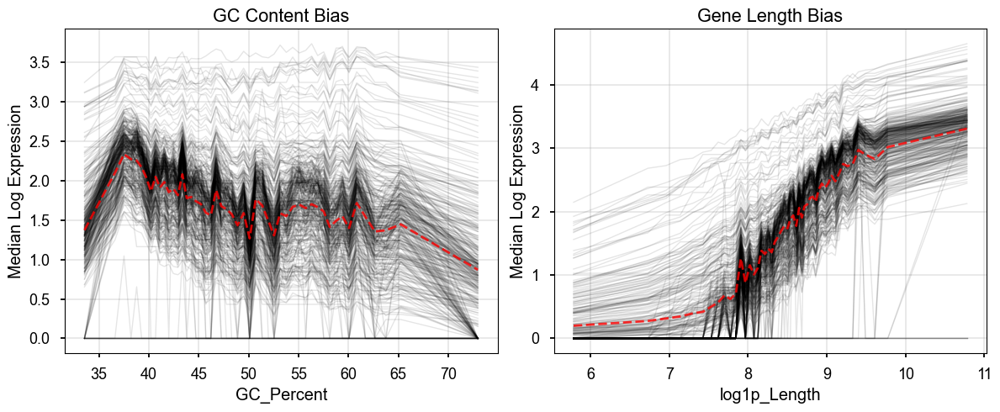

In [56]:
def plot_bias_patterns(adata, feature_key, n_bins=50, ax=None, title=None):
    # 1. Data Prep
    feat = adata.var[feature_key]
    valid = feat.notna()
    X = adata[:, valid].X
    feat = feat[valid]

    bins = pd.qcut(feat, q=n_bins, duplicates='drop')
    intervals = sorted(bins.unique())
    x_centers = [i.mid for i in intervals]
    
    sample_trends = []
    for b in intervals:
        mask = (bins == b).values
        bin_medians = np.median(X[:, mask], axis=1)
        sample_trends.append(bin_medians)
        
    df = pd.DataFrame(sample_trends, index=x_centers, columns=adata.obs_names)

    ax.plot(df.index, df.values, color='k', alpha=0.1, lw=1)
    ax.plot(df.index, df.mean(axis=1), color='r', alpha=0.8, lw=2, ls='--', label='Global Mean')
    ax.set_title(title if title else f"Bias: {feature_key}")
    ax.set_xlabel(feature_key)
    ax.set_ylabel("Median Log Expression")
    ax.grid(alpha=0.3)
    return ax

# --- Execution ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

adata = pipeline.adata.copy()
adata.var['log1p_Length'] = np.log1p(adata.var['Length'])
# GC Bias
plot_bias_patterns(adata, 'GC_Percent', ax=axes[0], title="GC Content Bias")  # 컬럼명 수정 필요

# Length Bias
plot_bias_patterns(adata, 'log1p_Length', ax=axes[1], title="Gene Length Bias") # 컬럼명 수정 필요

plt.tight_layout()
plt.show()

### Check Bias ~ Batch Relationship

In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.spatial.distance import pdist, squareform
try:
    from skbio.stats.distance import permanova
    from skbio import DistanceMatrix
    has_skbio = True
except ImportError:
    has_skbio = False

In [69]:
df_obs = pipeline.adata.obs.copy()
bias_cols = ['orig_gc_bias_score', 'orig_len_bias_score', 'orig_platelet_score', 'log1p_total_counts']
batch_col = 'Batch_Granular'

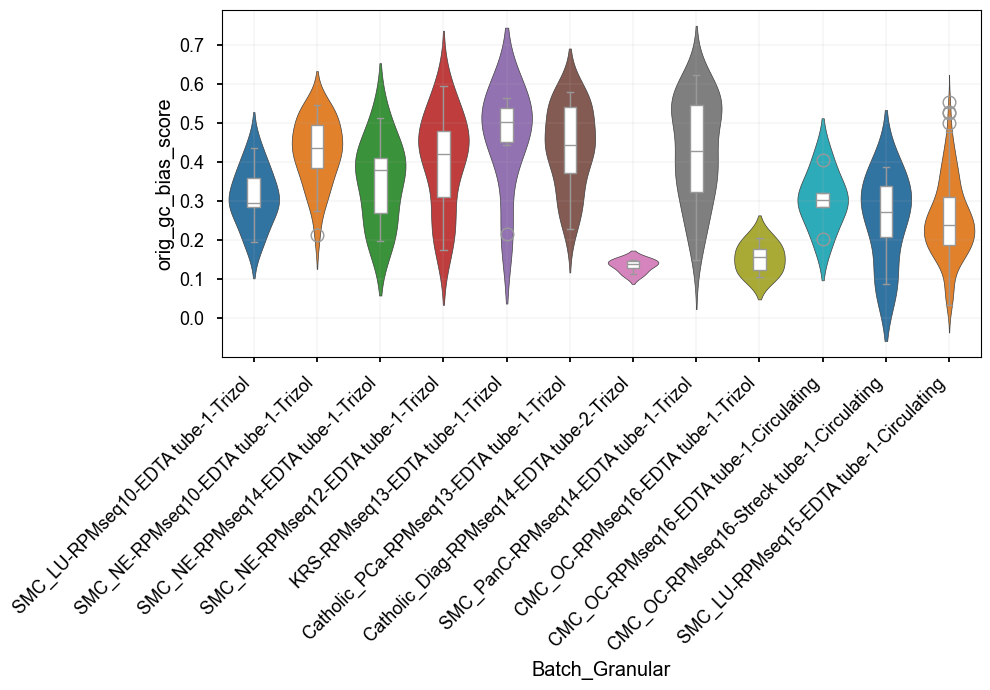

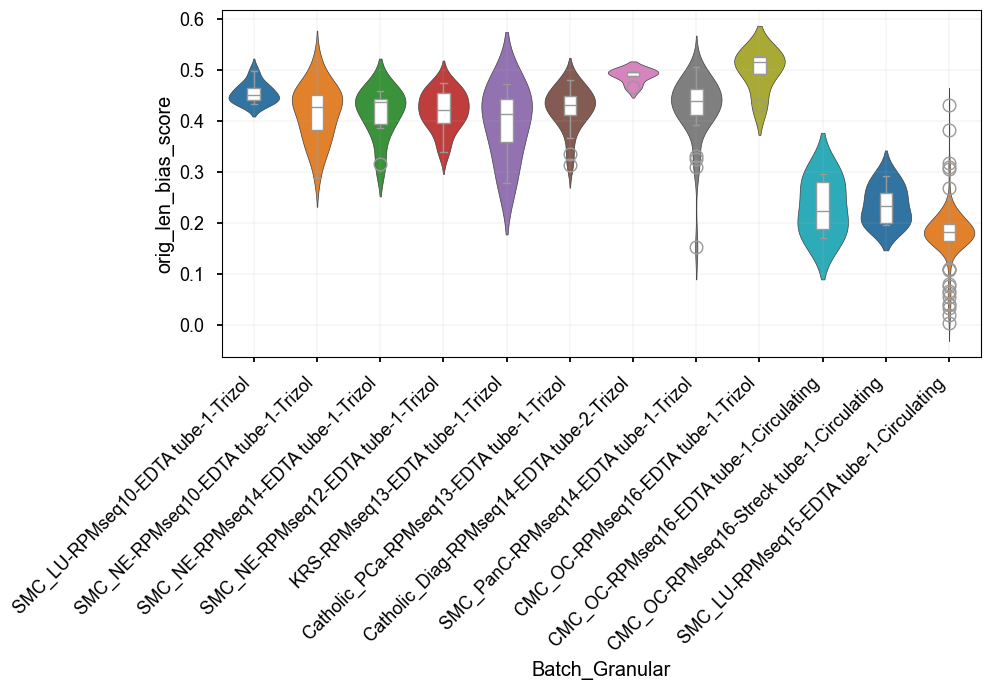

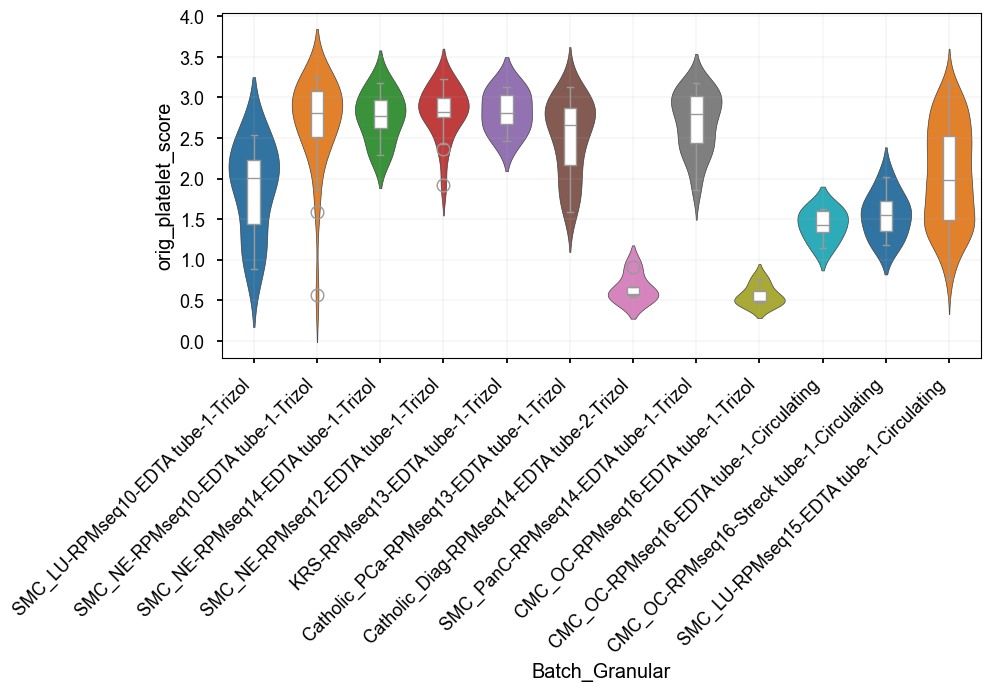

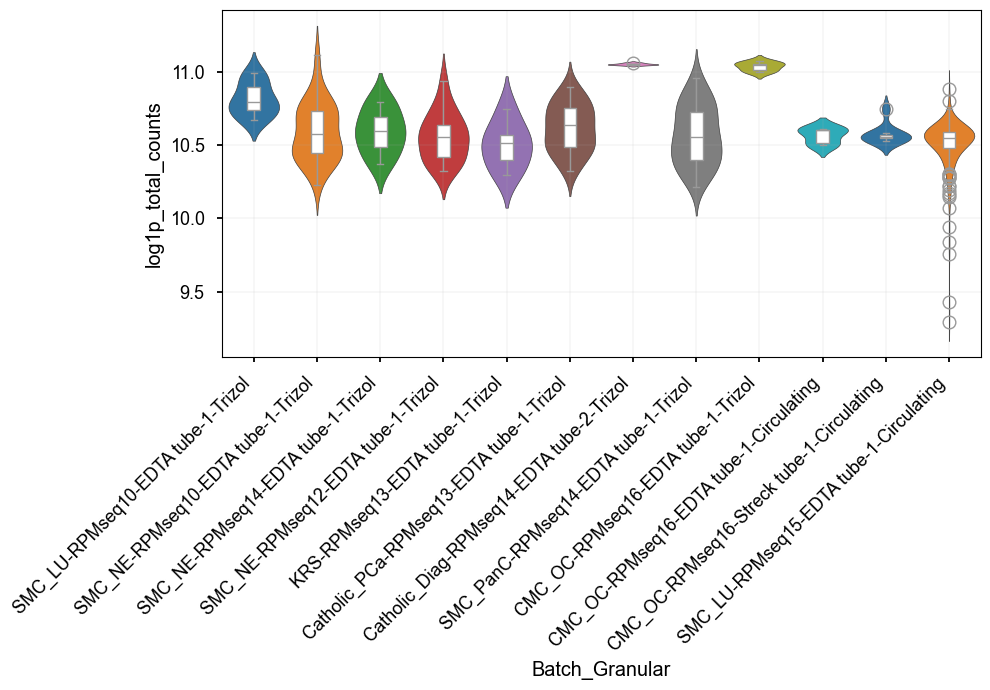

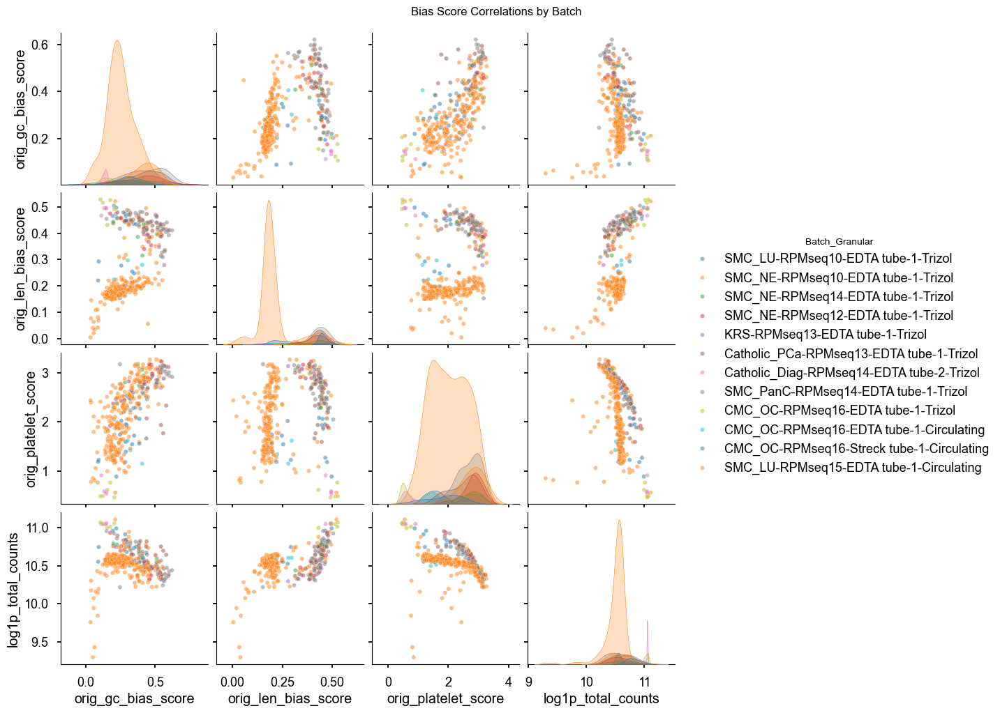

### Univariate Statistical Analysis (Batch Effect) ###
            Bias_Score  KW_Statistic  p-value  Eta_Squared Effect_Size_Class
0   orig_gc_bias_score      138.8485      0.0       0.3874             Large
1  orig_len_bias_score      247.8099      0.0       0.7176             Large
2  orig_platelet_score      123.1764      0.0       0.3399             Large
3   log1p_total_counts       56.0778      0.0       0.1366            Medium


In [70]:
def plot_bias_distribution(df, bias_cols, batch_col):
    for col in bias_cols:
        plt.figure(figsize=(10, 7))
        ax = sns.violinplot(x=batch_col, y=col, data=df, inner=None, color=".8", hue=batch_col, palette='tab10')
        sns.boxplot(x=batch_col, y=col, data=df, width=0.2, ax=ax,
                    boxprops={'zorder': 2}, color="white")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.grid(alpha=0.1)
        plt.show()

def plot_bias_correlations(df, bias_cols, batch_col):
    g = sns.pairplot(df[bias_cols + [batch_col]], 
                     hue=batch_col, 
                     diag_kind="kde", 
                     plot_kws={'alpha': 0.5, 's': 20},
                     palette="tab10")
    
    g.fig.suptitle("Bias Score Correlations by Batch", y=1.02)
    plt.show()

def run_permanova_analysis(df, bias_cols, batch_col):
    if not has_skbio:
        print("Error: scikit-bio is not installed.")
        return None

    bias_z = df[bias_cols].apply(stats.zscore)
    clean_data = bias_z.join(df[batch_col]).dropna()
    
    if clean_data.empty:
        print("No data available after dropping NaNs.")
        return None

    bias_matrix = clean_data[bias_cols]
    grouping = clean_data[batch_col]

    dm = pdist(bias_matrix, metric='euclidean')
    dm_sq = squareform(dm)
    dist_matrix = DistanceMatrix(dm_sq, ids=clean_data.index)
    perm_results = permanova(dist_matrix, grouping=grouping, permutations=9999)
    summary_data = {
        "Test_Method": "PERMANOVA (Euclidean)",
        "Grouping_Var": batch_col,
        "N_Samples": int(perm_results['sample size']),
        "N_Groups": int(perm_results['number of groups']),
        "Pseudo_F": perm_results['test statistic'], # 효과 크기 지표 (클수록 그룹 간 차이 큼)
        "p_value": perm_results['p-value'],
        "Permutations": perm_results['number of permutations']
    }
    
    res_df = pd.DataFrame([summary_data])
    def get_sig_star(p):
        if p < 0.001: return '***'
        elif p < 0.01: return '**'
        elif p < 0.05: return '*'
        else: return 'ns'
        
    res_df['Sig'] = res_df['p_value'].apply(get_sig_star)
    cols_order = ["Test_Method", "Grouping_Var", "N_Samples", "N_Groups", "Pseudo_F", "p_value", "Sig", "Permutations"]
    res_df = res_df[cols_order]

    return res_df

def kruskal_wallis_test(df, bias_cols, batch_col):
    results = []
    for col in bias_cols:
        # 1. Kruskal-Wallis Test
        groups = [group[col].values for name, group in df.groupby(batch_col)]
        H, p = stats.kruskal(*groups)
        
        # 2. Effect Size (Eta-squared for H-statistic)
        # Formula: (H - k + 1) / (n - k)
        # k: number of groups, n: total observations
        k = len(groups)
        n = len(df)
        eta_sq = (H - k + 1) / (n - k)
        
        # 음수 보정 (아주 드물게 발생 가능)
        eta_sq = max(0, eta_sq)
        
        results.append({
            'Bias_Score': col,
            'KW_Statistic': H,
            'p-value': p,
            'Eta_Squared': eta_sq,
            'Effect_Size_Class': 'Large' if eta_sq > 0.14 else ('Medium' if eta_sq > 0.06 else 'Small')
        })

    stats_df = pd.DataFrame(results)
    print("### Univariate Statistical Analysis (Batch Effect) ###")
    print(stats_df.round(4))
    return stats_df 

plot_bias_distribution(df_obs, bias_cols, batch_col)
plot_bias_correlations(df_obs, bias_cols, batch_col)
permanova_stats = run_permanova_analysis(df_obs, bias_cols, batch_col)
kruskal_stats = kruskal_wallis_test(df_obs, bias_cols, batch_col)

In [71]:
permanova_stats

,Test_Method,Grouping_Var,N_Samples,N_Groups,Pseudo_F,p_value,Sig,Permutations
0,PERMANOVA (Euclidean),Batch_Granular,342,12,27.752576,0.0001,***,9999


In [72]:
kruskal_stats

,Bias_Score,KW_Statistic,p-value,Eta_Squared,Effect_Size_Class
0,orig_gc_bias_score,138.848475,2.792771e-24,0.387420,Large
1,orig_len_bias_score,247.809900,8.030412e-47,0.717606,Large
2,orig_platelet_score,123.176375,4.157623e-21,0.339928,Large
3,log1p_total_counts,56.077823,4.916900e-08,0.136599,Medium


### Test for Replicates

Identified 9 replicate pairs.


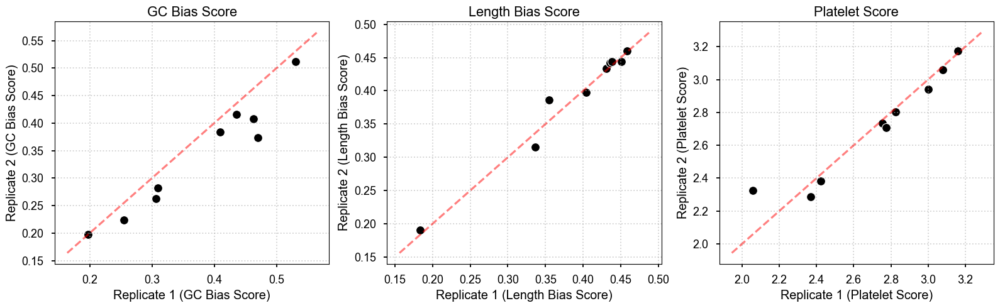

In [73]:
obs = pipeline.adata.obs.copy()
pair_map = {}
for sample_name, group in obs.groupby('Sample name'):
    if len(group) == 2:
        pair_map[sample_name] = group.index.tolist()

print(f"Identified {len(pair_map)} replicate pairs.")

paired_data = []

for sname, indices in pair_map.items():
    # Sort indices to ensure consistency (e.g., S_... vs S_..._1)
    indices = sorted(indices)
    row_a = obs.loc[indices[0]]
    row_b = obs.loc[indices[1]]
    
    paired_data.append({
        'Sample name': sname,
        'ID_A': indices[0], 'ID_B': indices[1],
        'gc_A': row_a['orig_gc_bias_score'], 'gc_B': row_b['orig_gc_bias_score'],
        'len_A': row_a['orig_len_bias_score'], 'len_B': row_b['orig_len_bias_score'],
        'platelet_A': row_a['orig_platelet_score'], 'platelet_B': row_b['orig_platelet_score']
    })
df_paired = pd.DataFrame(paired_data)

metrics = [
    ('gc', 'GC Bias Score'), 
    ('len', 'Length Bias Score'), 
    ('platelet', 'Platelet Score')
]
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for i, (metric_prefix, title) in enumerate(metrics):
    ax = axes[i]
    x_col = f'{metric_prefix}_A'
    y_col = f'{metric_prefix}_B'
    
    sns.scatterplot(data=df_paired, x=x_col, y=y_col, ax=ax, s=100, color='black')
    
    # Add x=y line
    min_val = min(df_paired[x_col].min(), df_paired[y_col].min())
    max_val = max(df_paired[x_col].max(), df_paired[y_col].max())
    margin = (max_val - min_val) * 0.1
    ax.plot([min_val - margin, max_val + margin], [min_val - margin, max_val + margin], 'r--', alpha=0.5, label='x=y')
    
    ax.set_title(title)
    ax.set_xlabel(f"Replicate 1 ({title})")
    ax.set_ylabel(f"Replicate 2 ({title})")
    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()

Identified 9 replicate pairs.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:227: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(adata, mask_var, use_highly_variable)


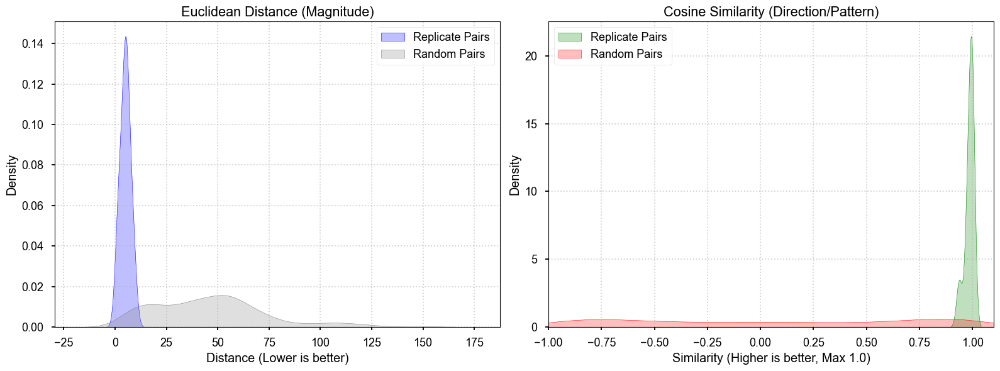

=== Distance & Similarity Test ===
[Euclidean] Rep Mean: 4.9420 vs Random Mean: 46.2798
P-value (Rep < Random Distance): 4.5375e-07

[Cosine Sim] Rep Mean: 0.9848 vs Random Mean: 0.0436
P-value (Rep > Random Similarity): 4.9256e-07


In [74]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import euclidean, cosine, pdist
from itertools import combinations
from scipy.stats import mannwhitneyu

adata_processed = pipeline.adata.copy()
# 1. Replicate Pair 식별 (기존 로직 유지)
obs = adata_processed.obs
pair_map = {}
for sample_name, group in obs.groupby('Sample name'):
    if len(group) == 2:
        pair_map[sample_name] = group.index.tolist()

print(f"Identified {len(pair_map)} replicate pairs.")

# 2. PCA 수행 (전체 데이터에 대해 한 번만 수행하는 것이 정석입니다)
# HVG가 지정되지 않았다면 먼저 계산하는 것을 추천합니다.
if 'highly_variable' not in adata_processed.var:
    sc.pp.highly_variable_genes(adata_processed, n_top_genes=2000)
    
sc.tl.pca(adata_processed, svd_solver='arpack', use_highly_variable=True)
pca_coords = adata_processed.obsm['X_pca']

# 3. 거리 및 유사도 계산
replicate_distances = []
random_distances = []
replicate_similarities = []  # 코사인 유사도 저장용
random_similarities = []     # 코사인 유사도 저장용

# (1) Replicate 간 계산
for sname, (id_a, id_b) in pair_map.items():
    idx_a = adata_processed.obs_names.get_loc(id_a)
    idx_b = adata_processed.obs_names.get_loc(id_b)
    
    vec_a = pca_coords[idx_a, :5]
    vec_b = pca_coords[idx_b, :5]
    
    # 유클리드 거리
    replicate_distances.append(euclidean(vec_a, vec_b))
    # 코사인 유사도 (1 - 코사인 거리)
    # scipy의 cosine 함수는 '거리(0~2)'를 반환하므로 1에서 빼줘야 유사도(-1~1)가 됨
    replicate_similarities.append(1 - cosine(vec_a, vec_b))

# (2) 무작위(Random) 계산
all_indices = np.arange(adata_processed.n_obs)
np.random.seed(42)
random_pairs = np.random.choice(all_indices, size=(1000, 2))

for idx_a, idx_b in random_pairs:
    name_a = adata_processed.obs.iloc[idx_a]['Sample name']
    name_b = adata_processed.obs.iloc[idx_b]['Sample name']
    
    if name_a != name_b: 
        vec_a = pca_coords[idx_a, :5]
        vec_b = pca_coords[idx_b, :5]
        
        random_distances.append(euclidean(vec_a, vec_b))
        random_similarities.append(1 - cosine(vec_a, vec_b))

# 4. 결과 시각화 (두 개의 플롯을 나란히 그림)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# (왼쪽) Euclidean Distance
sns.kdeplot(replicate_distances, fill=True, label='Replicate Pairs', color='blue', ax=axes[0])
sns.kdeplot(random_distances, fill=True, label='Random Pairs', color='grey', ax=axes[0])
axes[0].set_title("Euclidean Distance (Magnitude)")
axes[0].set_xlabel("Distance (Lower is better)")
axes[0].set_ylabel("Density")
axes[0].legend()
axes[0].grid(True, linestyle=':', alpha=0.6)

# (오른쪽) Cosine Similarity
sns.kdeplot(replicate_similarities, fill=True, label='Replicate Pairs', color='green', ax=axes[1])
sns.kdeplot(random_similarities, fill=True, label='Random Pairs', color='red', ax=axes[1])
axes[1].set_title("Cosine Similarity (Direction/Pattern)")
axes[1].set_xlabel("Similarity (Higher is better, Max 1.0)")
axes[1].set_ylabel("Density")
axes[1].legend()
axes[1].grid(True, linestyle=':', alpha=0.6)
axes[1].set_xlim(-1, 1.1) # 코사인 유사도 범위 고정

plt.tight_layout()
plt.show()

# 통계 검정
print(f"=== Distance & Similarity Test ===")
print(f"[Euclidean] Rep Mean: {np.mean(replicate_distances):.4f} vs Random Mean: {np.mean(random_distances):.4f}")
_, p_dist = mannwhitneyu(replicate_distances, random_distances, alternative='less') # 거리는 작을수록 좋음
print(f"P-value (Rep < Random Distance): {p_dist:.4e}\n")

print(f"[Cosine Sim] Rep Mean: {np.mean(replicate_similarities):.4f} vs Random Mean: {np.mean(random_similarities):.4f}")
_, p_sim = mannwhitneyu(replicate_similarities, random_similarities, alternative='greater') # 유사도는 클수록 좋음
print(f"P-value (Rep > Random Similarity): {p_sim:.4e}")

### Bias/Phenotype Relationship in Batch

Plotting orig_gc_bias_score ...


/tmp/ipykernel_1916020/3953567800.py:173: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


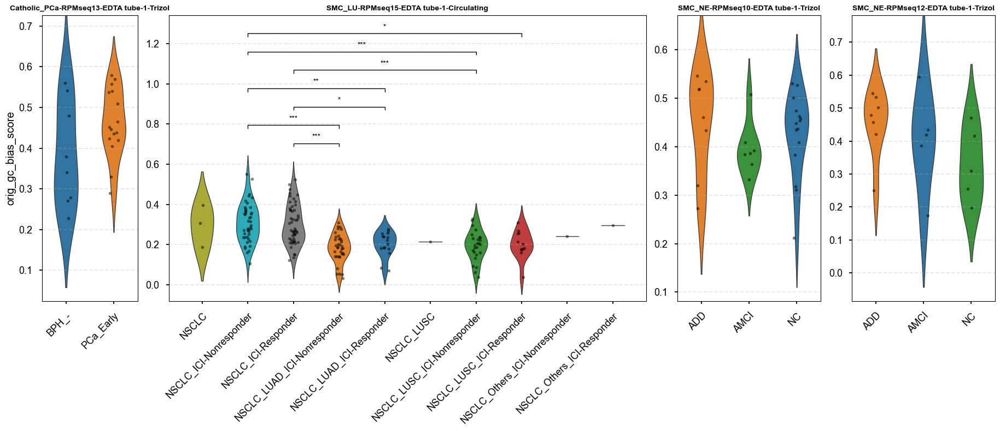

Plotting orig_len_bias_score ...


/tmp/ipykernel_1916020/3953567800.py:173: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


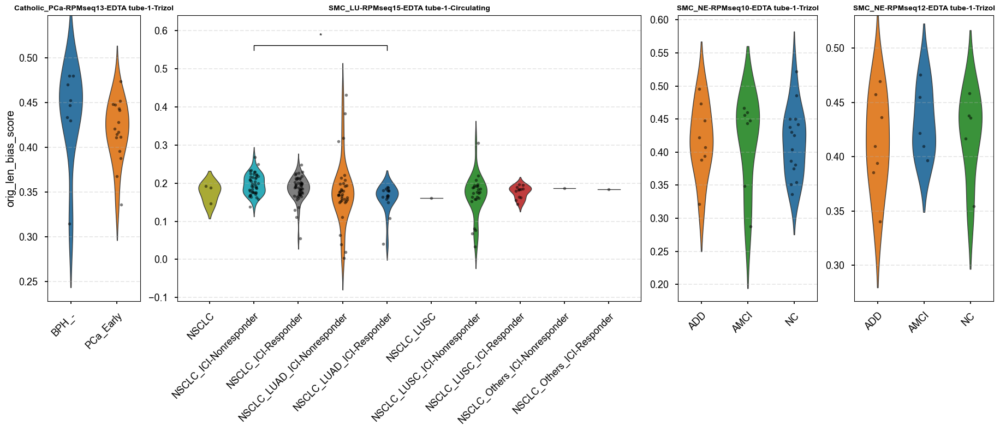

Plotting orig_platelet_score ...


/tmp/ipykernel_1916020/3953567800.py:173: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


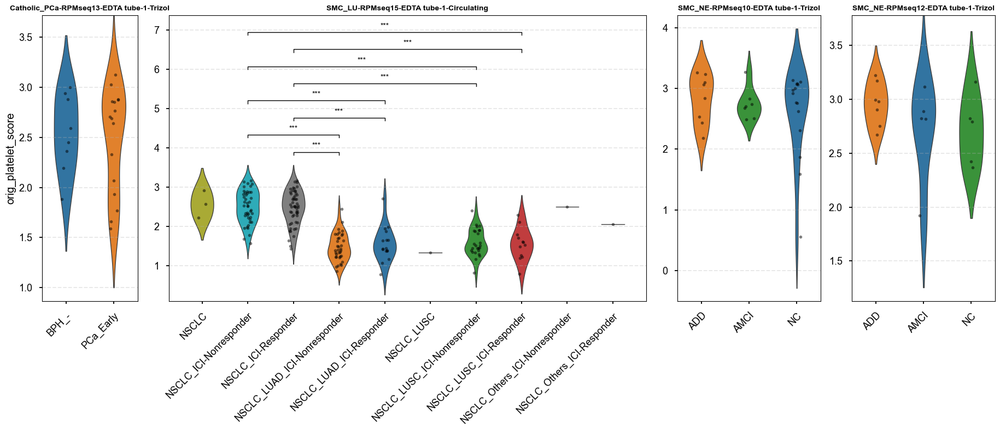

Plotting log1p_total_counts ...


/tmp/ipykernel_1916020/3953567800.py:173: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


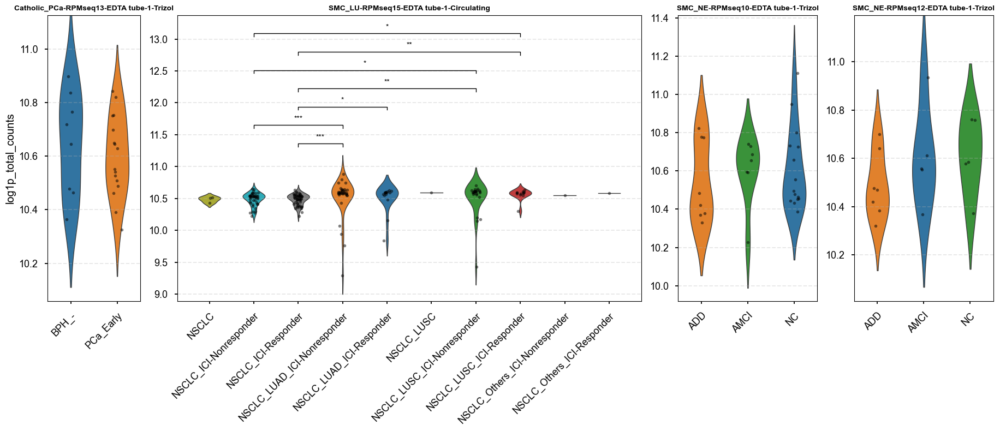

In [75]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from itertools import combinations
import math

# ==============================================================================
# 1. 데이터 전처리 및 설정
# ==============================================================================
obs = adata_processed.obs.copy()
bias_metrics = ['orig_gc_bias_score', 'orig_len_bias_score', 'orig_platelet_score','log1p_total_counts']
batch_col = 'Batch_Granular'

# Type Granular 생성 (NaN 처리 포함)
cols = ['Type', 'Subtype', 'Responder']
obs['Type_Granular'] = obs[cols].apply(lambda row: '_'.join(row.dropna().astype(str)), axis=1)
pheno_col = 'Type_Granular'

# ==============================================================================
# 2. 통계 시각화 헬퍼 함수 (논문 스타일 Bracket 그리기)
# ==============================================================================
def add_stat_annotation(ax, data, x, y, order, pairs, test='Wilcoxon', text_format='star', p_threshold=0.05):
    """
    논문 스타일로 통계 유의성(Bracket + Asterisk)을 추가하는 함수
    """
    # y축 범위 확인 (브라켓 쌓을 공간 계산)
    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    
    # 브라켓 높이 설정
    line_height = y_range * 0.02
    text_height = y_range * 0.02
    step_height = y_range * 0.08  # 브라켓 간 간격
    
    current_y = y_max # 데이터의 최대값 위에서 시작하지 않고, plot의 ylim 위에서 시작
    
    # 데이터 최대값 재계산 (실제 데이터 기준)
    # violinplot 상단 여유분을 위해 조금 더 높게 시작점을 잡음
    group_max = data.groupby(x)[y].max()
    current_y = group_max.max() + (y_range * 0.1)

    significant_combinations = []
    
    # 모든 쌍에 대해 통계 검정 수행
    for pair in pairs:
        g1, g2 = pair
        d1 = data[data[x] == g1][y]
        d2 = data[data[x] == g2][y]
        
        # 샘플 수 체크
        if len(d1) < 2 or len(d2) < 2: continue

        # --- 통계 검정 (Wilcoxon Rank-Sum) ---
        try:
            stat, p_val = stats.ranksums(d1, d2)
        except ValueError:
            continue
            
        # --- Bonferroni Correction ---
        # (엄격하게 하려면 len(pairs)로 곱해줌)
        adj_p_val = p_val * len(pairs)
        if adj_p_val > 1.0: adj_p_val = 1.0
        
        # 유의한 경우만 리스트에 추가
        if adj_p_val < p_threshold:
            significant_combinations.append(((g1, g2), adj_p_val))

    # P-value 오름차순 정렬 (작은 범위부터 그려야 겹치지 않음 -> 여기서는 거리순이 좋으나 편의상 p-value순)
    # 더 좋은 시각화를 위해 "x축 인덱스 거리"가 짧은 것부터 그리는 것이 일반적임
    significant_combinations.sort(key=lambda x: abs(order.index(x[0][0]) - order.index(x[0][1])))

    # 브라켓 그리기
    for (g1, g2), p_val in significant_combinations:
        # x축 인덱스 찾기
        x1 = order.index(g1)
        x2 = order.index(g2)
        
        # 별표 생성
        if p_val < 0.001: star = '***'
        elif p_val < 0.01: star = '**'
        elif p_val < 0.05: star = '*'
        else: star = 'ns'
        
        if text_format == 'full':
            text = f"p={p_val:.1e}"
        else:
            text = star

        # 브라켓 좌표 계산
        # 해당 구간의 데이터 최대값을 피해서 그려야 함 (여기서는 단순화하여 stack 방식 사용)
        bar_y = current_y + step_height
        
        # 선 그리기 (ㄷ 자)
        ax.plot([x1, x1, x2, x2], [bar_y, bar_y + line_height, bar_y + line_height, bar_y], 
                lw=1.0, c='black')
        
        # 텍스트 쓰기
        ax.text((x1 + x2) / 2, bar_y + line_height + text_height, text, 
                ha='center', va='bottom', color='black', fontsize=10)
        
        # 다음 브라켓을 위해 높이 올림
        current_y = bar_y + line_height + text_height

    # y축 범위 업데이트 (브라켓이 잘리지 않도록)
    ax.set_ylim(y_min, current_y + (y_range * 0.1))


# ==============================================================================
# 3. 배치 필터링 및 시각화 루프
# ==============================================================================

# Phenotype이 2개 이상인 배치만 선택
batch_counts = obs.groupby(batch_col)[pheno_col].nunique()
valid_batches = batch_counts[batch_counts > 1].index.tolist()
valid_batches.sort()

if not valid_batches:
    print("비교 가능한 배치가 없습니다.")
else:
    for metric in bias_metrics:
        # --- 동적 레이아웃 설정 ---
        # 각 배치별 그룹 개수 계산 (이것이 subplot의 너비 비율이 됨)
        batch_group_counts = [obs[obs[batch_col]==b][pheno_col].nunique() for b in valid_batches]
        
        # 전체 figure 크기 계산 (그룹 1개당 너비 1.2인치 정도 할당)
        total_width = sum(batch_group_counts) * 0.8 + len(valid_batches) # 여백 포함
        if total_width < 6: total_width = 6 # 최소 너비 보장
        
        # Subplot 생성 (1행 N열, 너비 비율 적용)
        fig, axes = plt.subplots(1, len(valid_batches), 
                                 figsize=(total_width, 8), 
                                 gridspec_kw={'width_ratios': batch_group_counts},
                                 constrained_layout=True)
        
        if len(valid_batches) == 1: axes = [axes]
        
        print(f"Plotting {metric} ...")

        for ax, batch in zip(axes, valid_batches):
            subset = obs[obs[batch_col] == batch].copy()
            
            # 순서 정렬
            local_order = sorted(subset[pheno_col].unique())
            
            # --- 기본 플롯 (Violin + Strip) ---
            sns.violinplot(data=subset, x=pheno_col, y=metric, order=local_order,
                           ax=ax, hue=pheno_col, inner=None, linewidth=1., width=0.5)
            
            sns.stripplot(data=subset, x=pheno_col, y=metric, order=local_order,
                          ax=ax, color='black', alpha=0.5, size=4, jitter=True)
            
            # --- 통계 분석 및 브라켓 추가 ---
            # 모든 조합(Combination) 생성
            combs = list(combinations(local_order, 2))
            
            # 함수 호출하여 브라켓 그리기
            add_stat_annotation(ax, subset, x=pheno_col, y=metric, 
                                order=local_order, pairs=combs,
                                test='Wilcoxon', text_format='star') # 'star' or 'full'
            
            # --- 스타일링 ---
            ax.set_title(f"{batch}", fontweight='bold', fontsize=10)
            ax.set_xlabel("")
            ax.set_ylabel(metric if ax == axes[0] else "") # 첫 번째만 y라벨 표시
            
            # x축 라벨 정리
            ax.set_xticks(range(len(local_order)))
            ax.set_xticklabels(local_order, rotation=45, ha='right', rotation_mode='anchor')
            ax.grid(axis='y', linestyle='--', alpha=0.3)

        plt.tight_layout()
        plt.show()

### Check Bias For Cohorts 


 Processing: RPMseq10
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19420 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


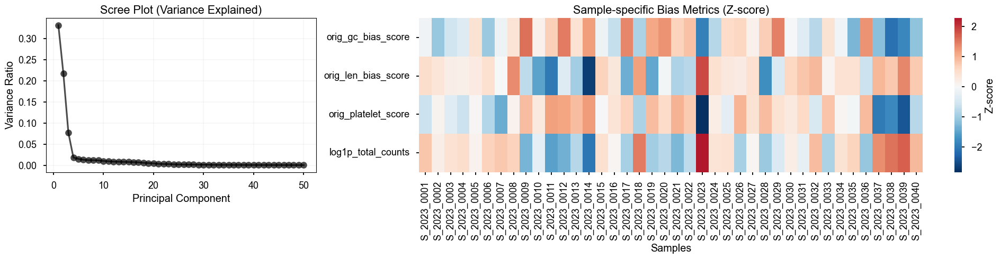

--- [Step 2-2] PCA Scatter Plots ---


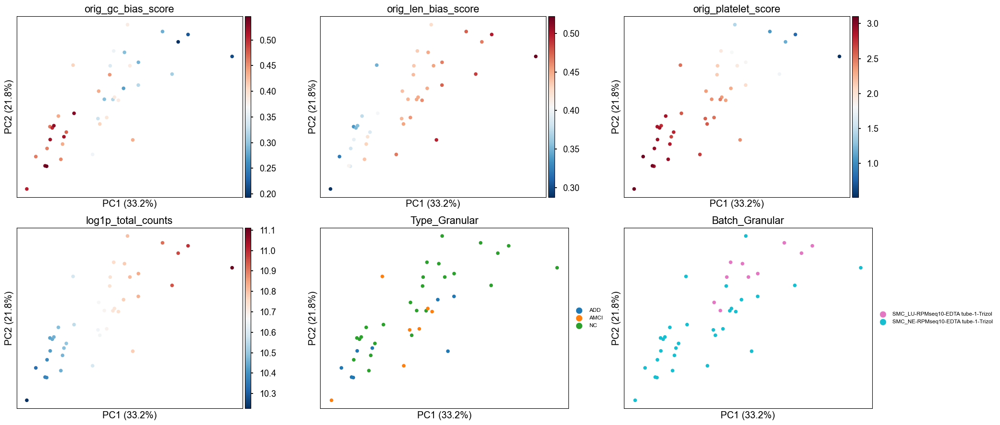

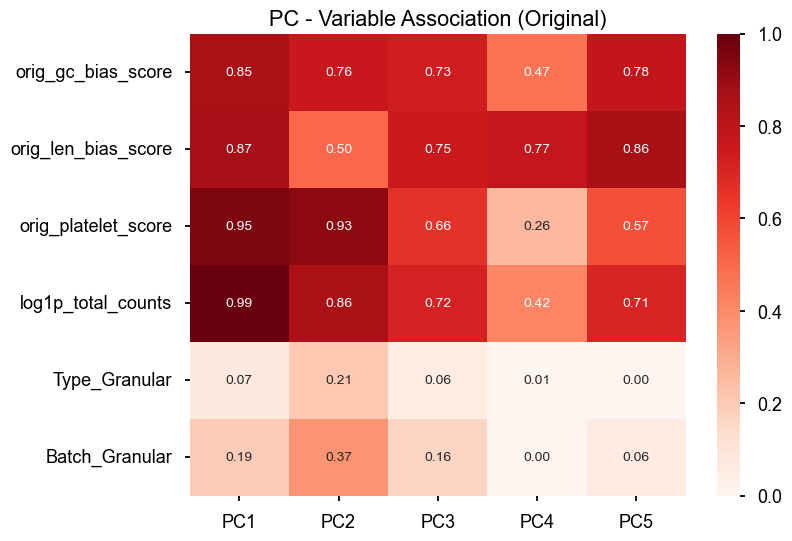

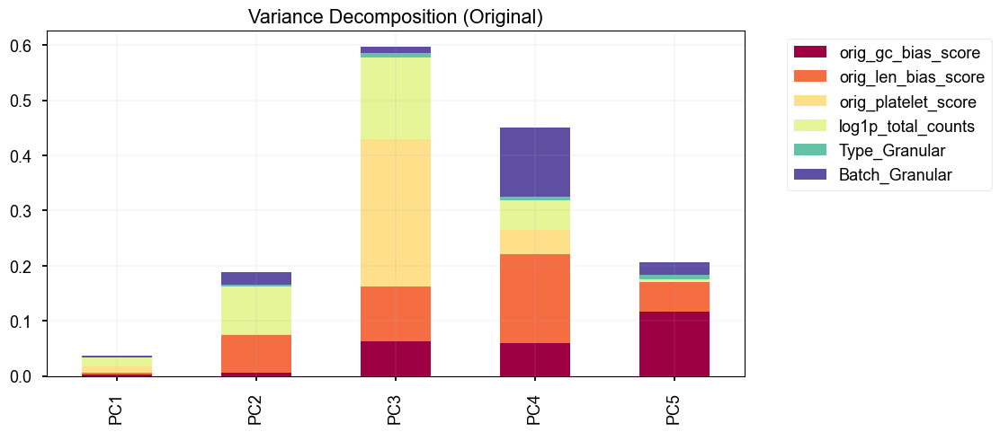

--- [Step 6] Partial Correlation Analysis (Original) ---


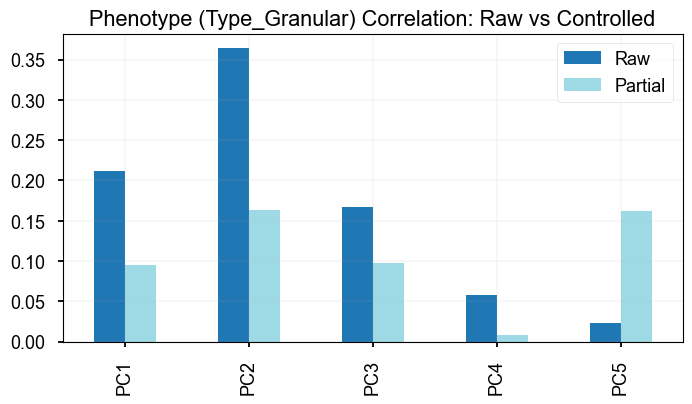

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


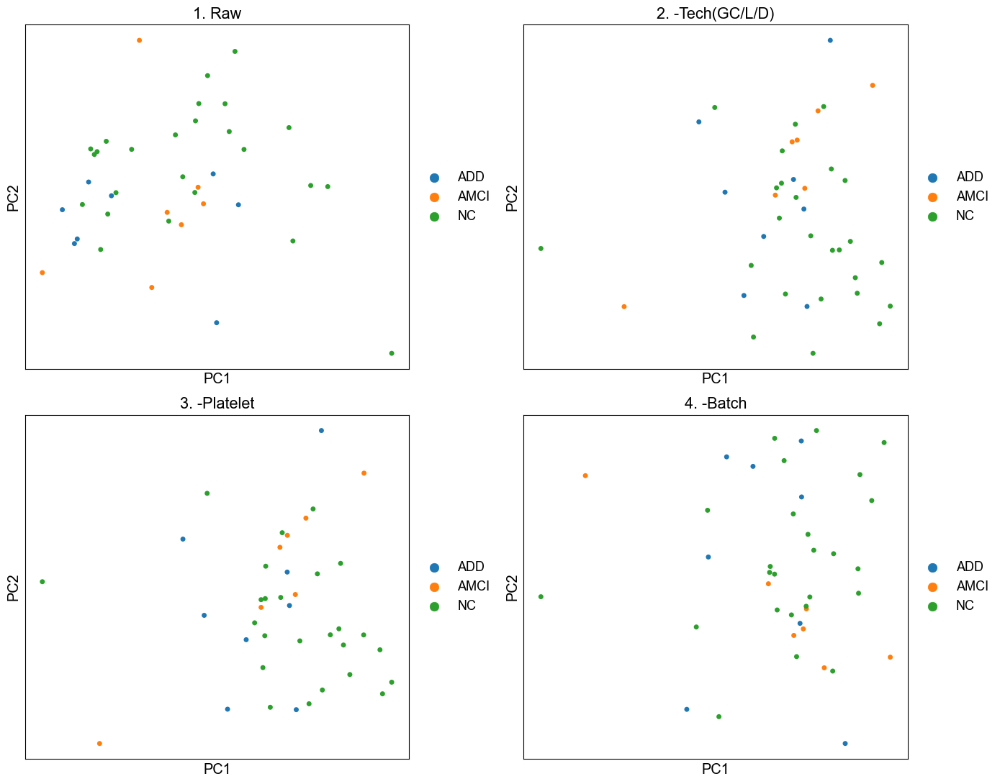

Displaying Metric Evolution (Spearman/ANOVA)...


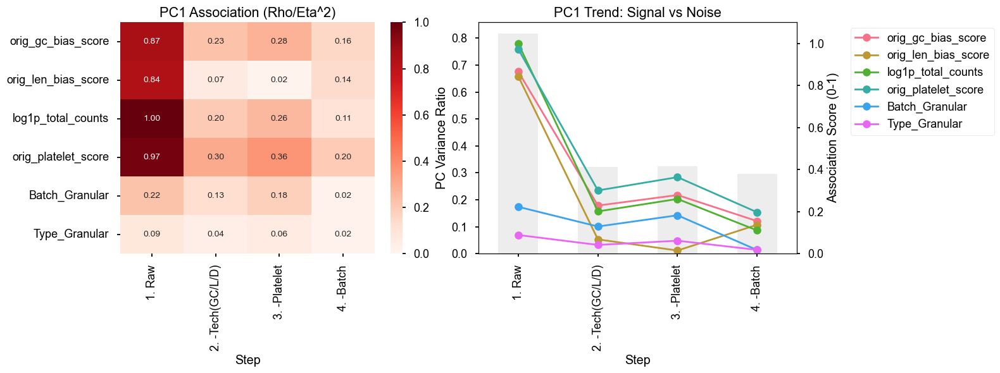

--- Finished Analysis for RPMseq10 ---

 Processing: RPMseq12
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19252 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


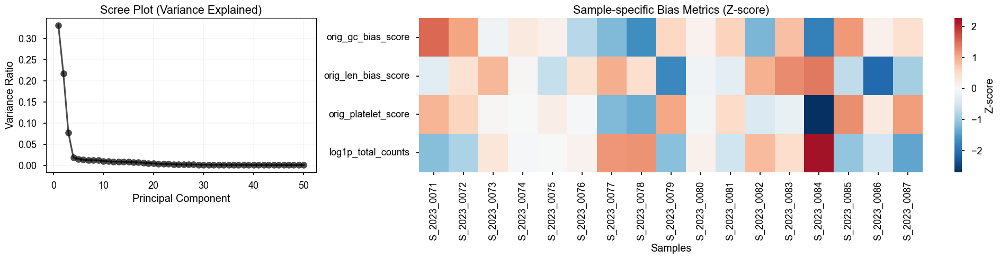

--- [Step 2-2] PCA Scatter Plots ---


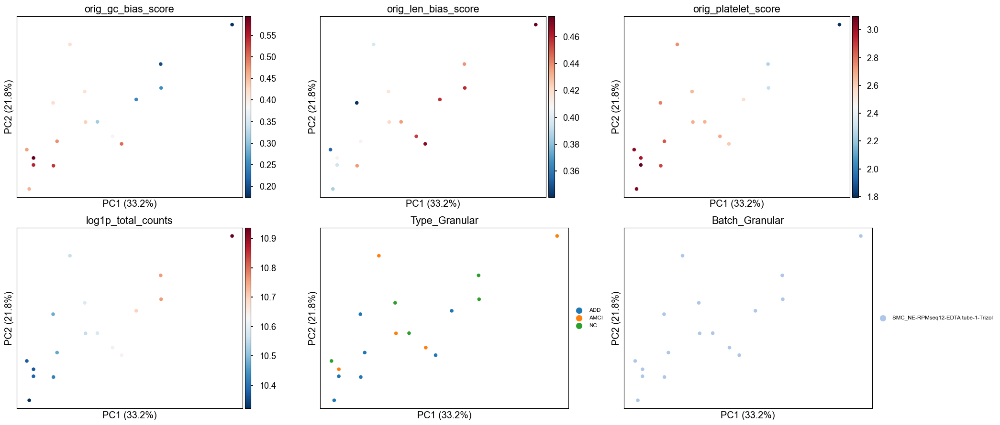

Skipping ANOVA for Batch_Granular: only one group present.


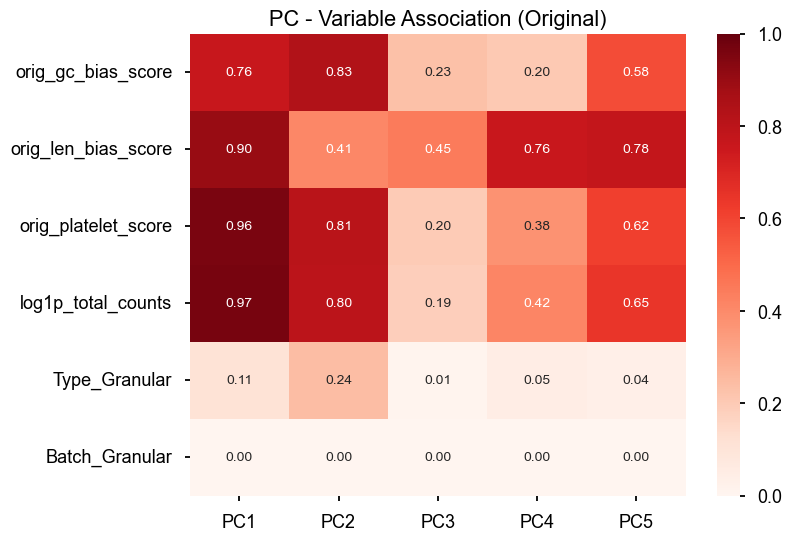

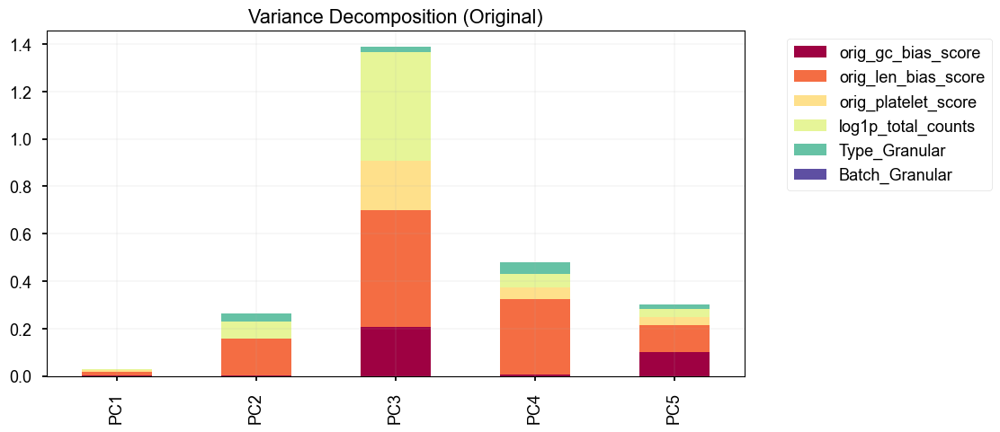

--- [Step 6] Partial Correlation Analysis (Original) ---


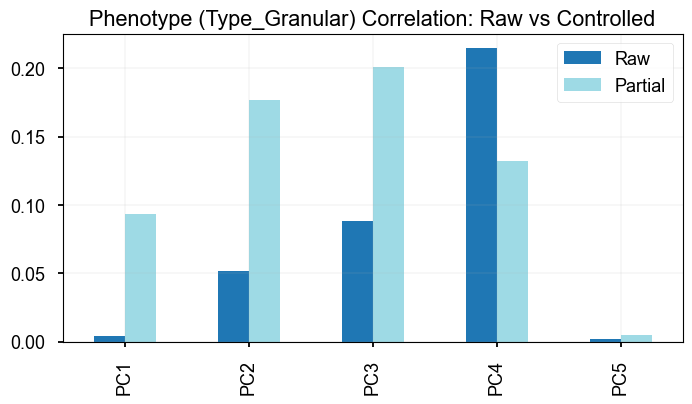

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


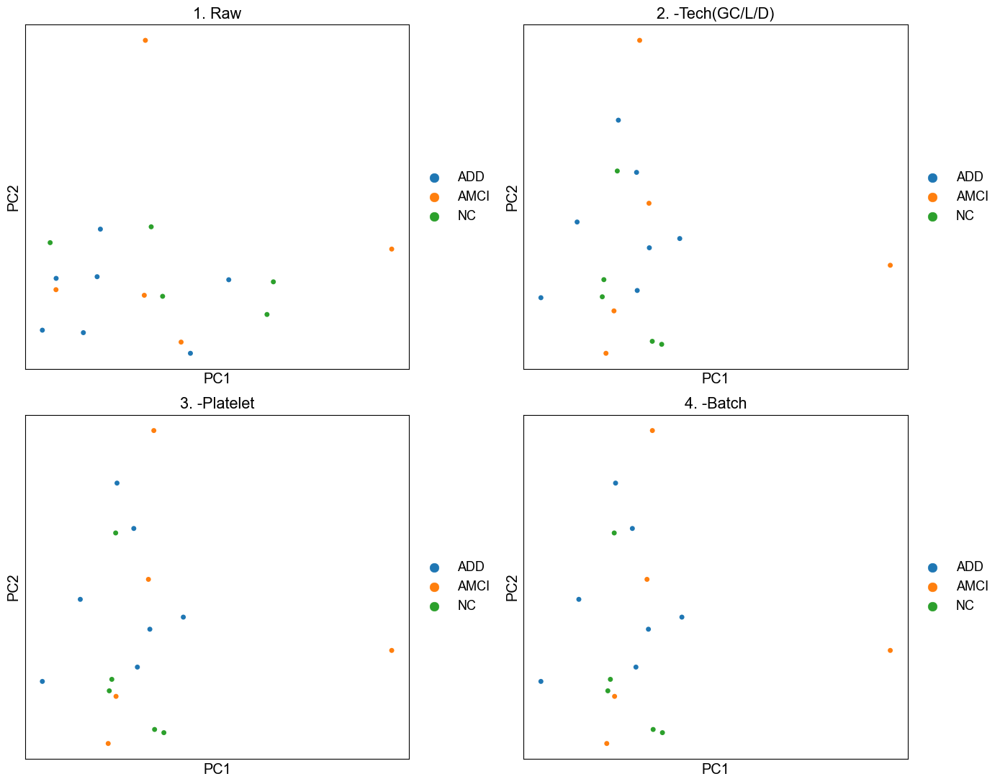

Displaying Metric Evolution (Spearman/ANOVA)...


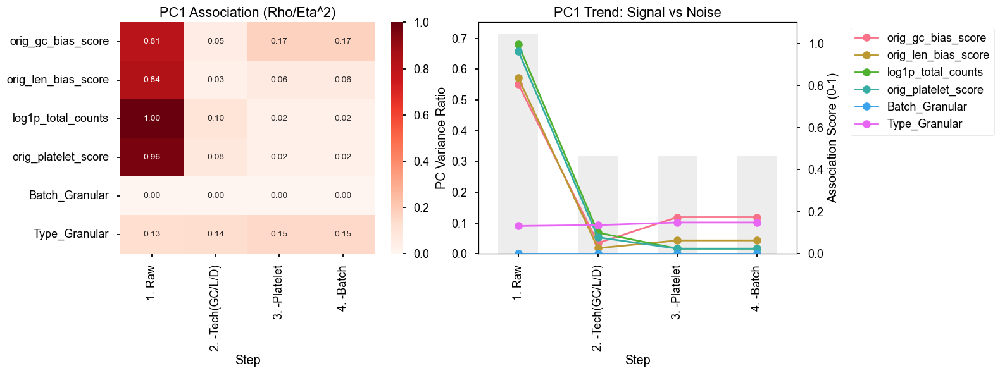

--- Finished Analysis for RPMseq12 ---

 Processing: RPMseq13
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19312 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


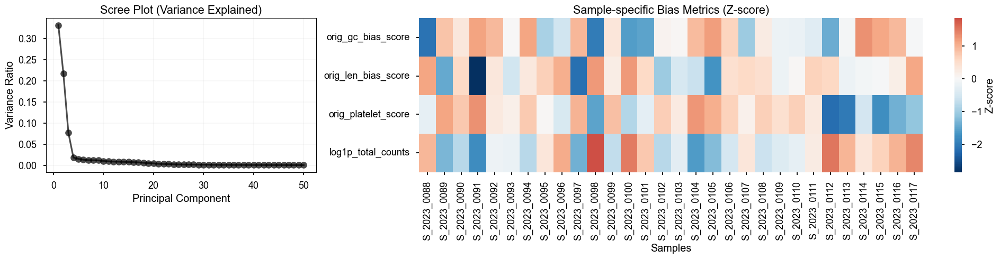

--- [Step 2-2] PCA Scatter Plots ---


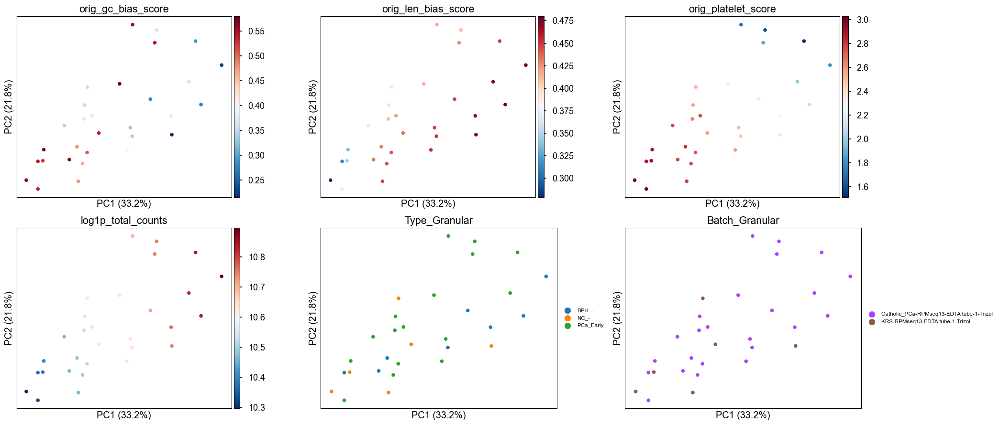

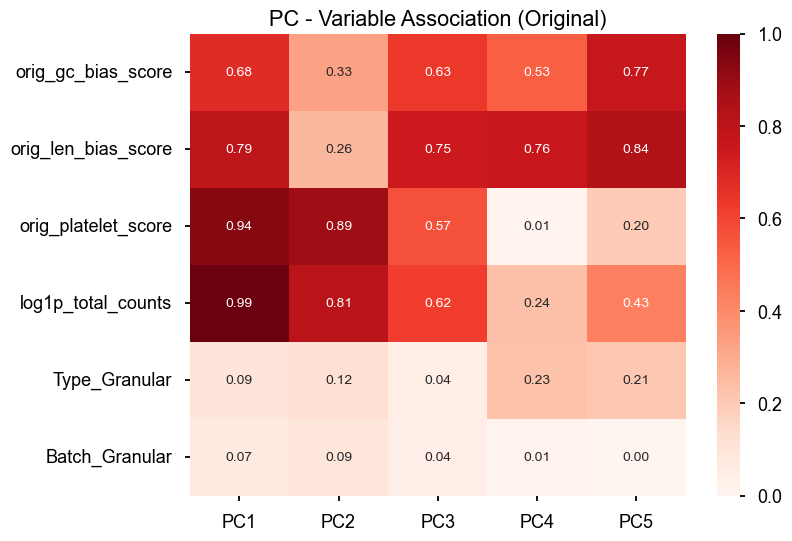

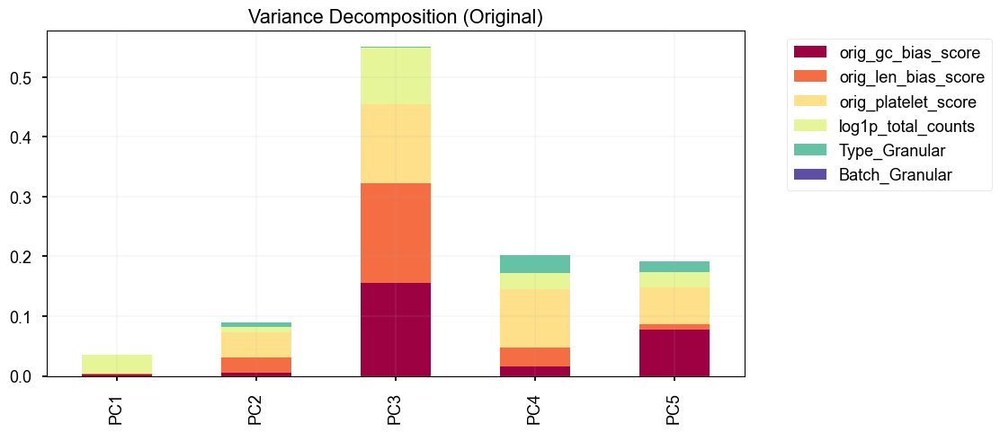

--- [Step 6] Partial Correlation Analysis (Original) ---


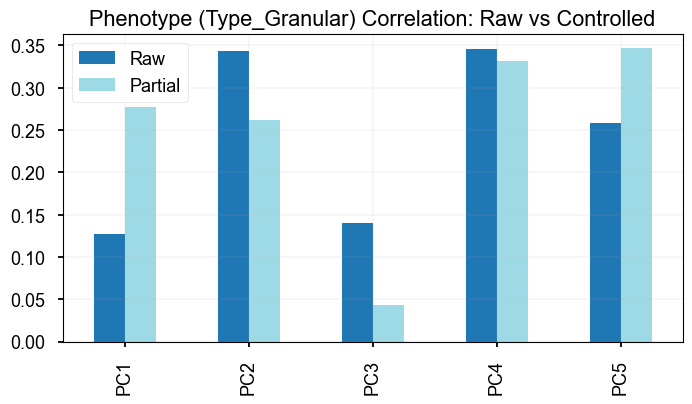

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


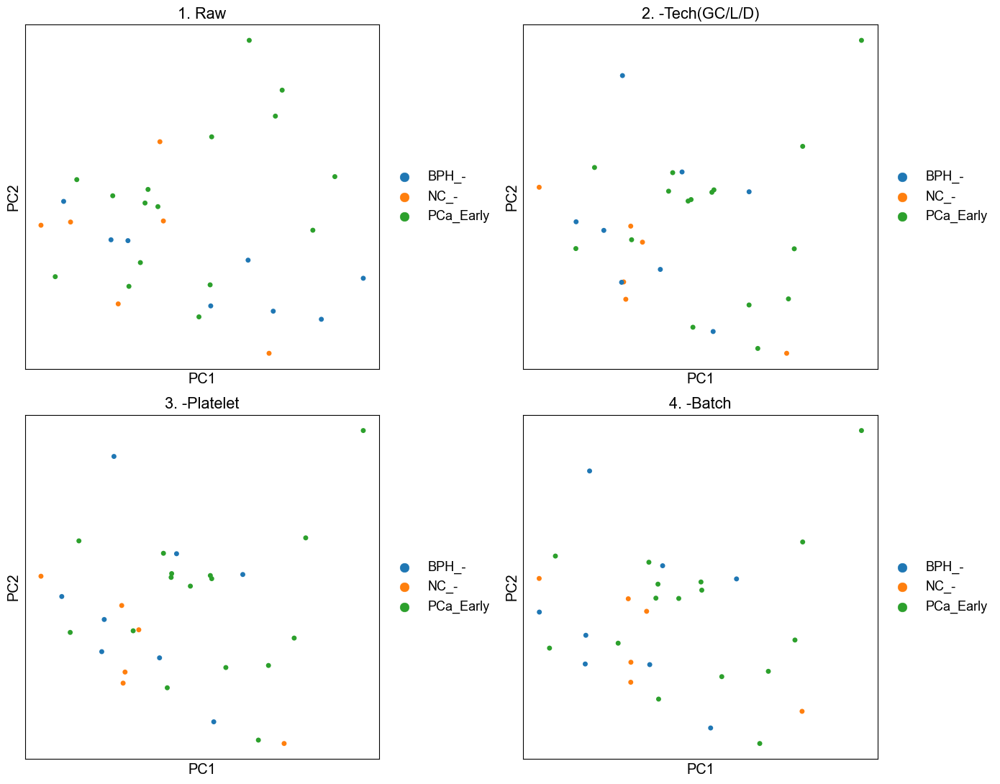

Displaying Metric Evolution (Spearman/ANOVA)...


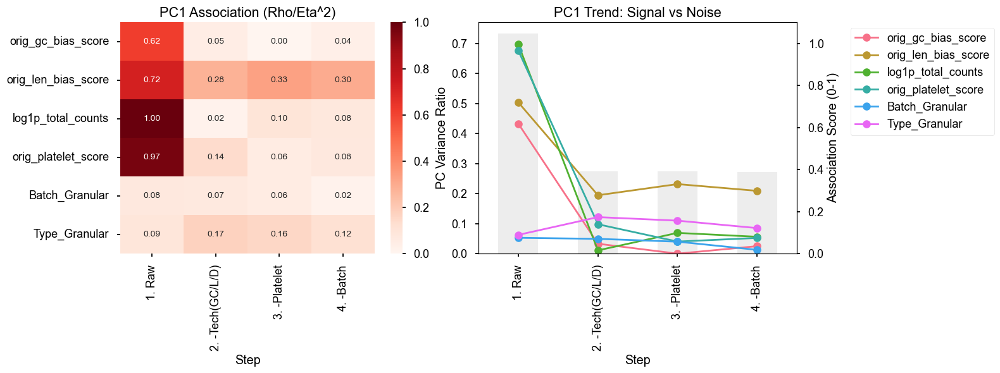

--- Finished Analysis for RPMseq13 ---

 Processing: RPMseq14
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19359 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


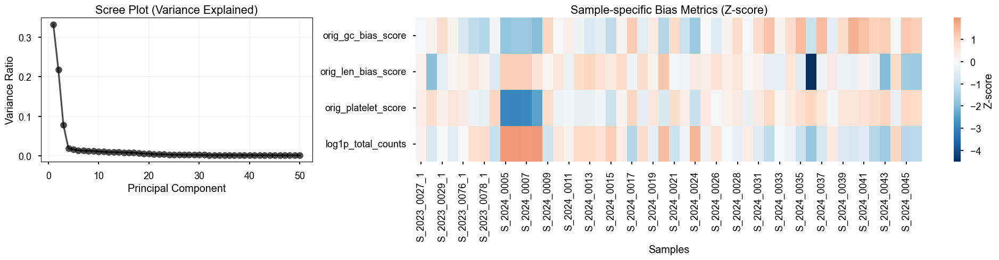

--- [Step 2-2] PCA Scatter Plots ---


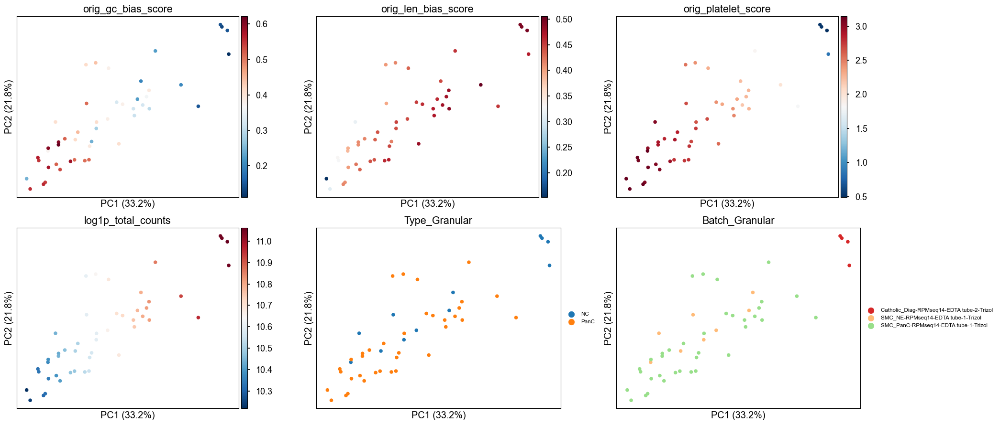

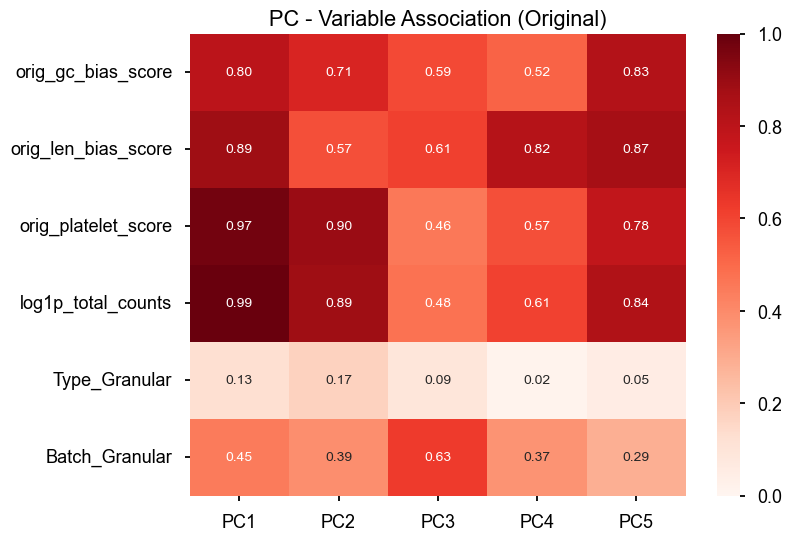

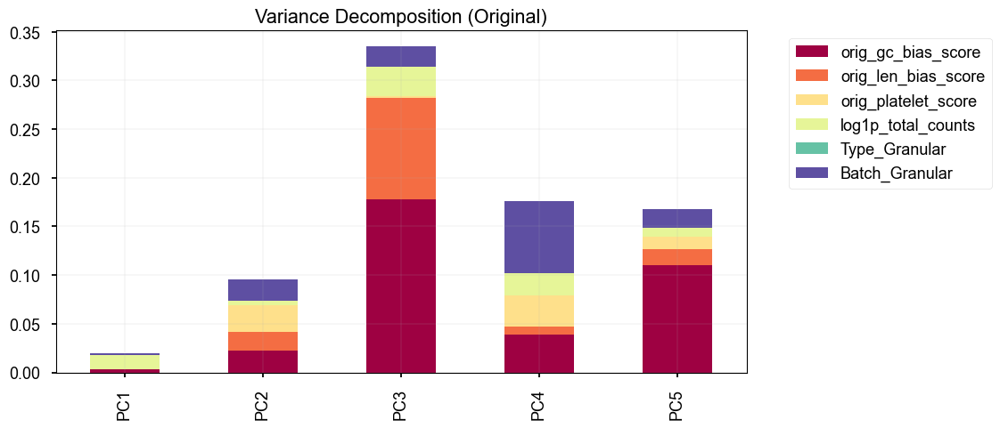

--- [Step 6] Partial Correlation Analysis (Original) ---


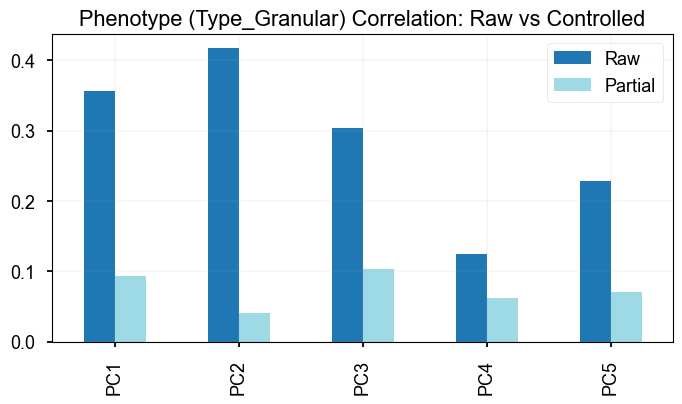

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


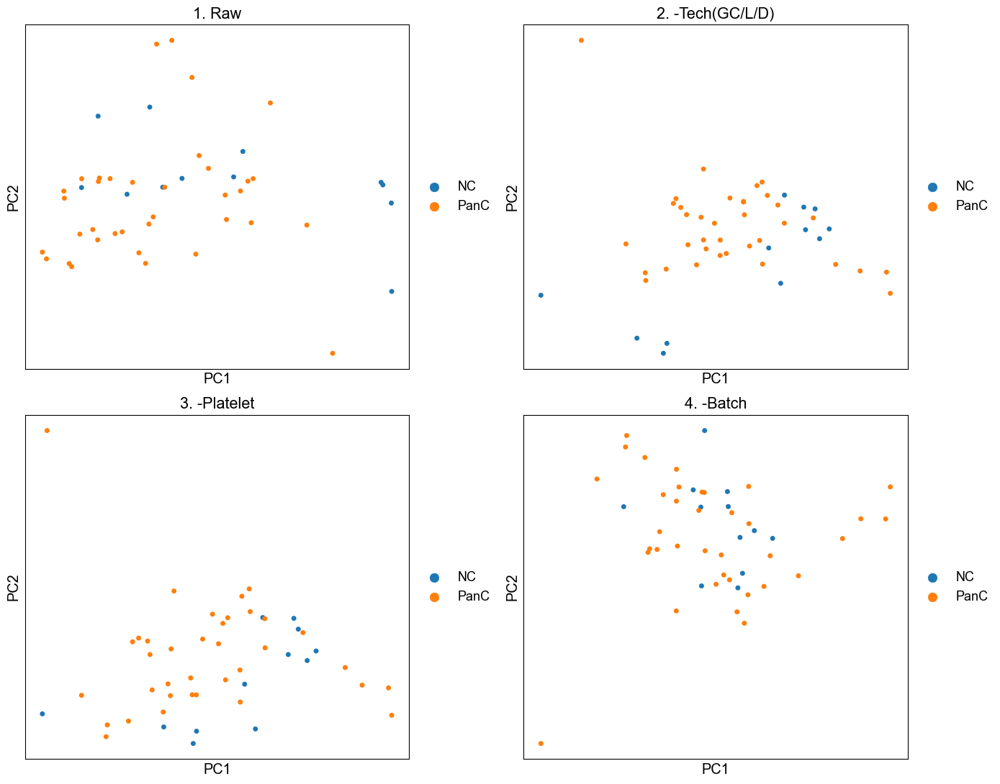

Displaying Metric Evolution (Spearman/ANOVA)...


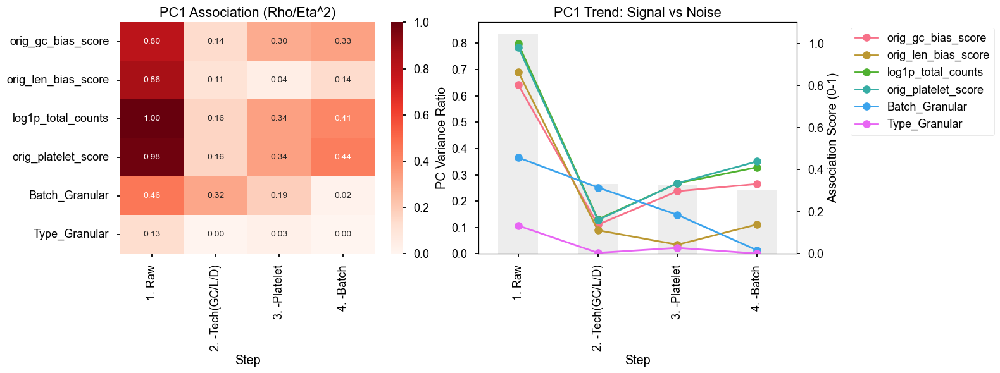

--- Finished Analysis for RPMseq14 ---

 Processing: RPMseq15
[RPMseq15] Removing samples with total counts < 441162.20
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19171 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


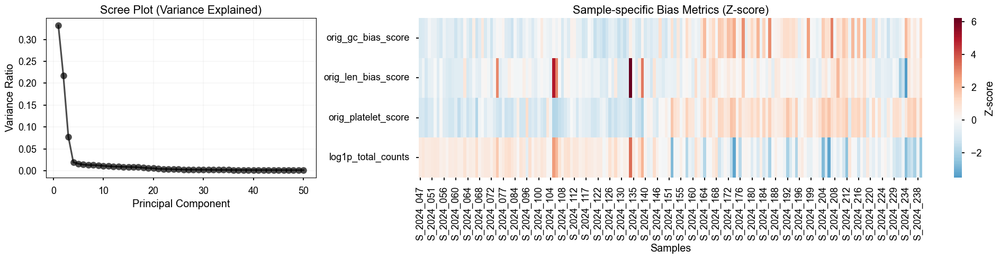

--- [Step 2-2] PCA Scatter Plots ---


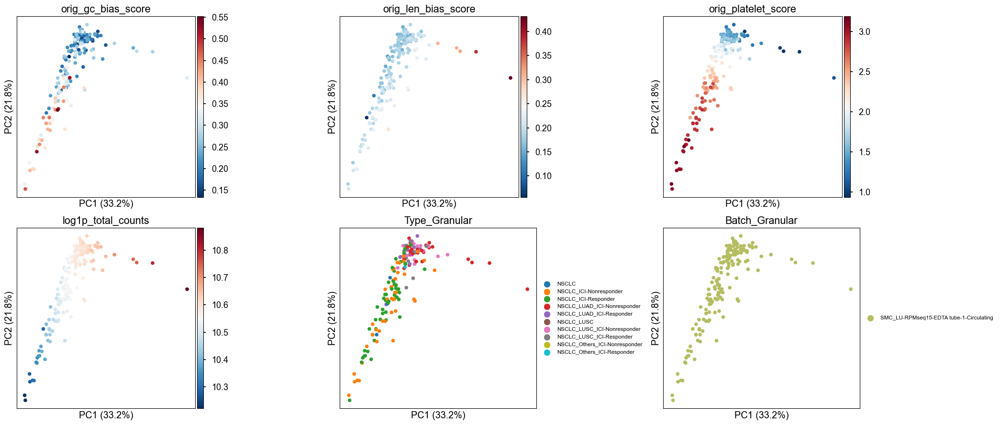

Skipping ANOVA for Batch_Granular: only one group present.


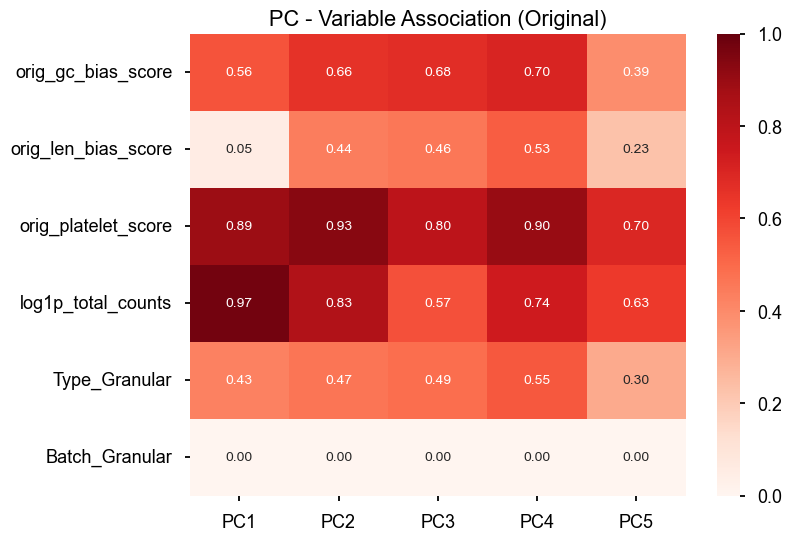

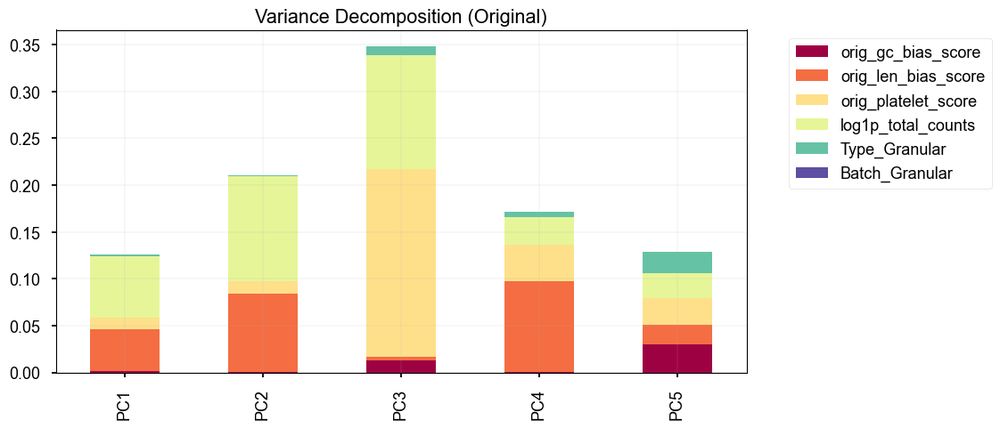

--- [Step 6] Partial Correlation Analysis (Original) ---


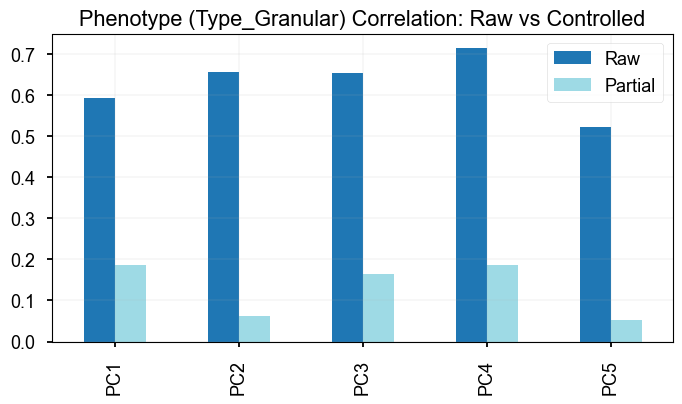

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 7 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


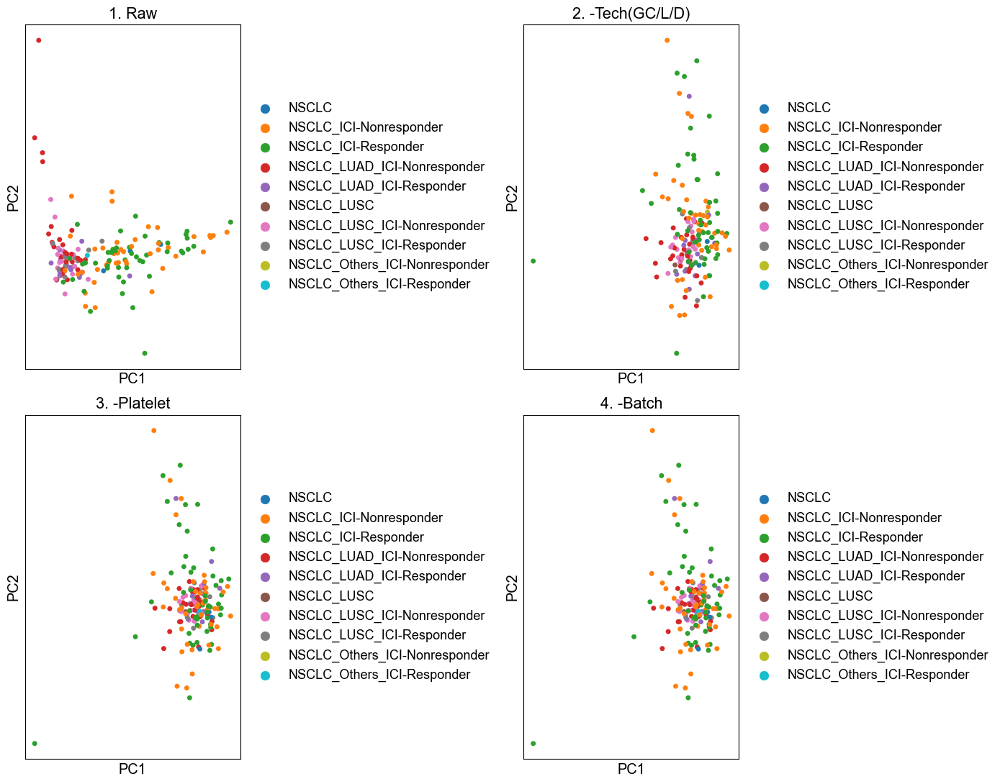

Displaying Metric Evolution (Spearman/ANOVA)...


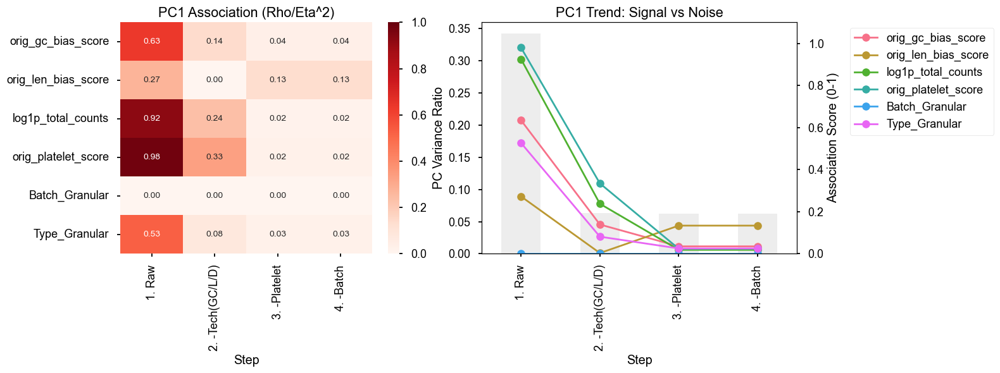

--- Finished Analysis for RPMseq15 ---


In [59]:
seq_ids = ['RPMseq10', 'RPMseq12', 'RPMseq13', 'RPMseq14', 'RPMseq15']

for sid in seq_ids:
    print(f"\n{'='*30}\n Processing: {sid}\n{'='*30}")
    adata_sub = adata[adata.obs.Seq_ID == sid].copy()
    sc.pp.filter_genes(adata_sub, min_cells=1)
    if sid == 'RPMseq15':
        temp_raw_sum = adata_sub.layers['raw_counts'].sum(axis=1)
        cutoff = np.quantile(temp_raw_sum, 0.1)
        print(f"[{sid}] Removing samples with total counts < {cutoff:.2f}")
        adata_sub = adata_sub[temp_raw_sum >= cutoff].copy()
        if 'Responder' in adata_sub.obs.columns:
            adata_sub.obs['Responder'] = adata_sub.obs['Responder'].astype('category')

    pipeline = RNASeqQCPipeline(
        adata=adata_sub,
        gene_type_col='GeneType',
        target_types=['protein_coding'],
        phenotype_col='Type_Granular', 
        batch_col='Batch_Granular',
        gc_col='GC_Percent',
        len_col='Length',
        platelet_col='is_platelet'
    )

    pipeline.prepare_data()
    pipeline.calculate_bias_metrics(is_original=True)
    pipeline.run_pca_diagnostics(use_original_metrics=True)
    pipeline.analyze_pc_associations(use_original_metrics=True)
    pipeline.analyze_variance_decomposition(use_original_metrics=True)
    pipeline.analyze_partial_correlation(use_original_metrics=True)
    pipeline.run_cascade_analysis(use_original_metrics=True)

    print(f"--- Finished Analysis for {sid} ---")

## Case Study : Normalization Methods

In [3]:
import pandas as pd
import numpy as np
import scanpy as sc
import os

# 경로 설정
base_dir = "/project/cfRNA_Disentaglement/Data/RPM/Processed"
out_path = os.path.join(base_dir, "Complete_Normalized_Data.h5ad")
obs = pd.read_csv(os.path.join(base_dir, "Final_Metadata.csv"), index_col=0)
var = pd.read_csv(os.path.join(base_dir, "Final_Gene_Annotation.csv"), index_col=0)
raw_path = os.path.join(base_dir, "Norm_Raw.csv")
df_raw = pd.read_csv(raw_path, index_col=0).T 
df_raw = df_raw.reindex(index=obs.index, columns=var.index).fillna(0)
adata = sc.AnnData(X=df_raw.values.astype(np.float32), obs=obs, var=var)
adata.layers['counts'] = adata.X.copy() 
norm_files = {
    "log_TMM":"Norm_TMM_log2.csv",
    "log_TPM":"Norm_TPM_log2.csv",
    "log_FPKM":"Norm_FPKM_log2.csv",
    "EDA_GC":"Norm_EDA_GC_Only.csv",
    "EDA_Length":"Norm_EDA_Len_Only.csv",
    "EDA_Within_Scale":"Norm_EDA_Scale_Only.csv",
    "EDA_Within_Full":"Norm_EDA_Within_Full.csv",
    "EDA+RUVg_k1":"Norm_Proposed_Full_k1.csv",
    "EDA+RUVg_k2":"Norm_Proposed_Full_k2.csv",
    "EDA+RUVg_k3":"Norm_Proposed_Full_k3.csv",
    "RUVg_k1":"Norm_RUVg_Platelet_k1.csv",
    "RUVg_k2":"Norm_RUVg_Platelet_k2.csv",
    "RUVg_k3":"Norm_RUVg_Platelet_k3.csv",
}

for layer_name, filename in norm_files.items():
    file_path = os.path.join(base_dir, filename)
    if os.path.exists(file_path):
        print(f"Processing {layer_name}...")
        try:
            df_temp = pd.read_csv(file_path, index_col=0).T
            df_aligned = df_temp.reindex(index=adata.obs_names, columns=adata.var_names).fillna(0)
            adata.layers[layer_name] = df_aligned.values.astype(np.float32)
        except Exception as e:
            print(f"  [Error] Failed to load {filename}: {e}")
    else:
        print(f"  [Warning] File not found: {filename}")

Processing log_TMM...
Processing log_TPM...
Processing log_FPKM...
Processing EDA_GC...
Processing EDA_Length...
Processing EDA_Within_Scale...
Processing EDA_Within_Full...
Processing EDA+RUVg_k1...
Processing EDA+RUVg_k2...
Processing EDA+RUVg_k3...
Processing RUVg_k1...
Processing RUVg_k2...
Processing RUVg_k3...


In [4]:
temp = sc.AnnData(X=adata.layers['counts'].copy())
sc.pp.normalize_total(temp, target_sum=1e6)
sc.pp.log1p(temp)
adata.layers['Standard_LogCPM'] = temp.X
print("Baseline created.")

adata.var['is_platelet'] = False
adata.var.loc[adata.var['GeneName'].isin(platelet_sigs['official gene symbol']), 'is_platelet'] = True
adata.var['is_platelet'].sum() # 127 platelet signature genes
adata.var['log10_Length'] = np.log10(adata.var['Length'])

pipeline = RNASeqQCPipeline(
    adata, 
    gene_type_col='GeneType',       # 유전자 타입 컬럼
    target_types=['protein_coding'],# 분석 대상
    phenotype_col='Type_Granular',  # 주 관심사 (질병/정상 등)
    batch_col='Batch_Granular',     # 배치 정보
    gc_col='GC_Percent',            # 유전자 GC 함량
    len_col='Length',               # 유전자 길이
    platelet_col='is_platelet'      # 혈소판 마커 여부 컬럼
)

# pipeline.prepare_data()
# pipeline.calculate_bias_metrics(is_original=True)

# adata_temp = pipeline.adata.copy()
# adata_temp.obs['Replicates'] = adata_temp.obs['Repliactes'].astype(str)
# del adata_temp.obs['Repliactes'] # Typo
# adata_temp.write_h5ad("./Data/RPM/Processed/Complete_Normalized_Data.h5ad")

Baseline created.
--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19604 genes left.
Preparation Done.
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.


In [23]:
adata.obs['Type_Granular'][adata.obs['Type_Granular'].str.contains('NC')] = 'NC'
adata_sub = adata[(adata.obs['Seq_ID'] == 'RPMseq14')|(adata.obs['RPM_NC_label'].notna()), :]

/tmp/ipykernel_16154/485143230.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['Type_Granular'][adata.obs['Type_Granular'].str.contains('NC')] = 'NC'


--- [Step 1] Preparing Metadata & Filtering ---
Filtered for ['protein_coding']: 19604 genes left.
Preparation Done.
Start Benchmarking across 13 methods...


  >>> Analyzing Method: log_TMM
--- [Switching Layer] Using: log_TMM ---
PCA and related metadata reset for layer: log_TMM
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


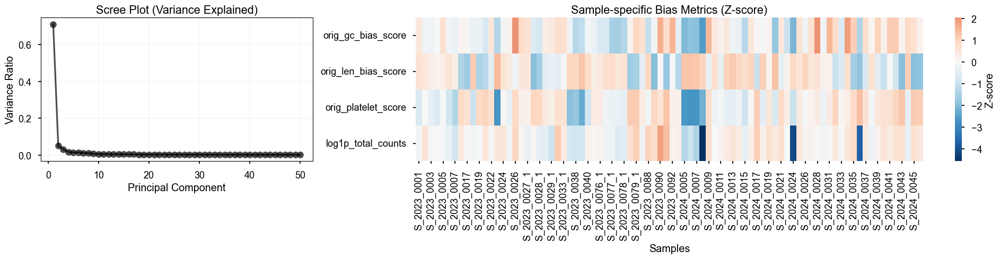

--- [Step 2-2] PCA Scatter Plots ---


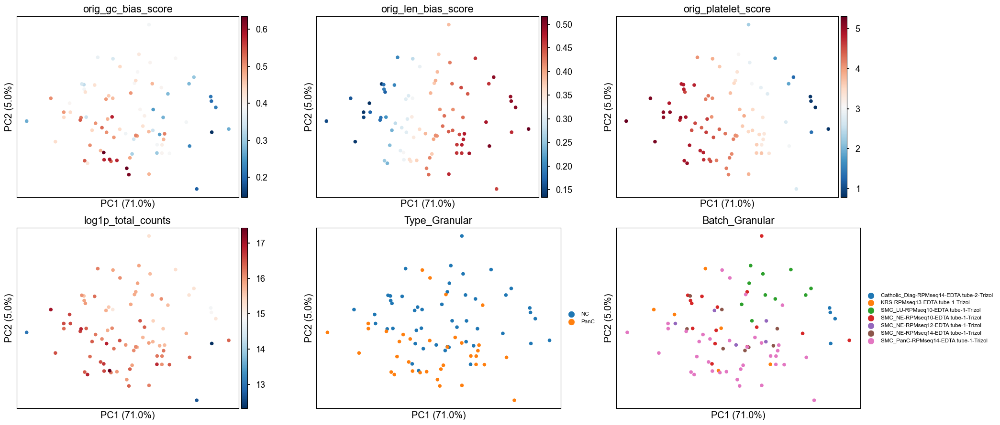

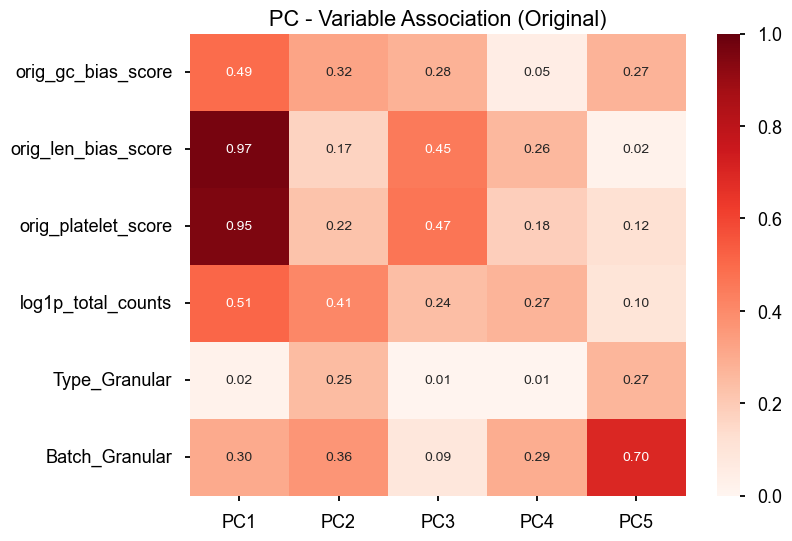

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


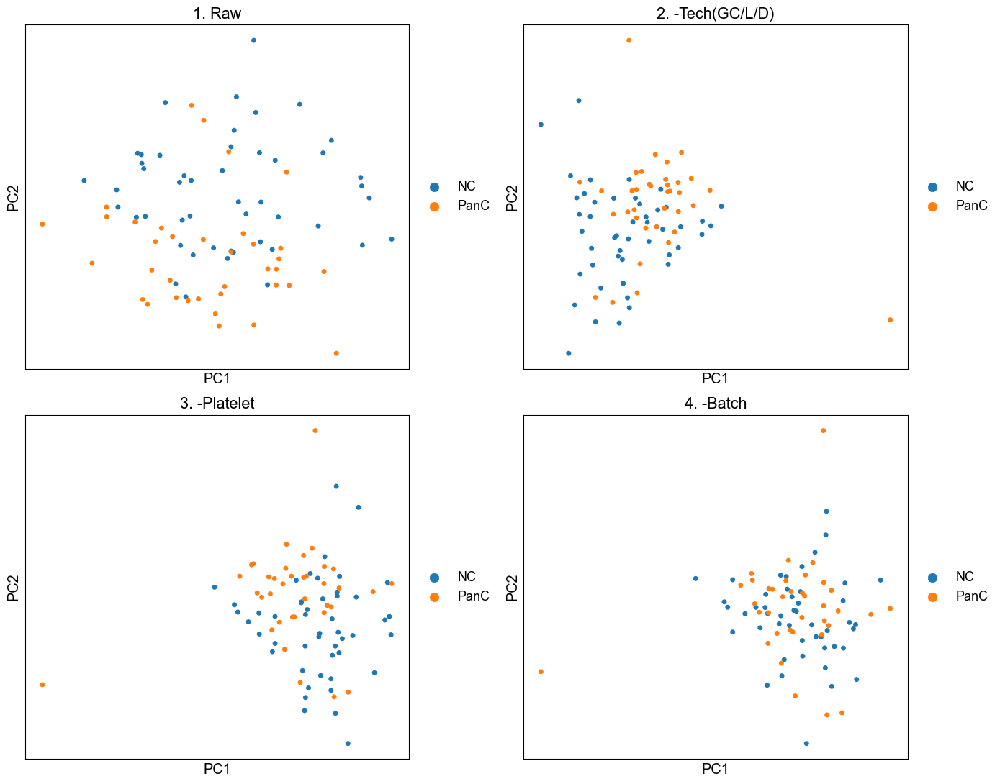

Displaying Metric Evolution (Spearman/ANOVA)...


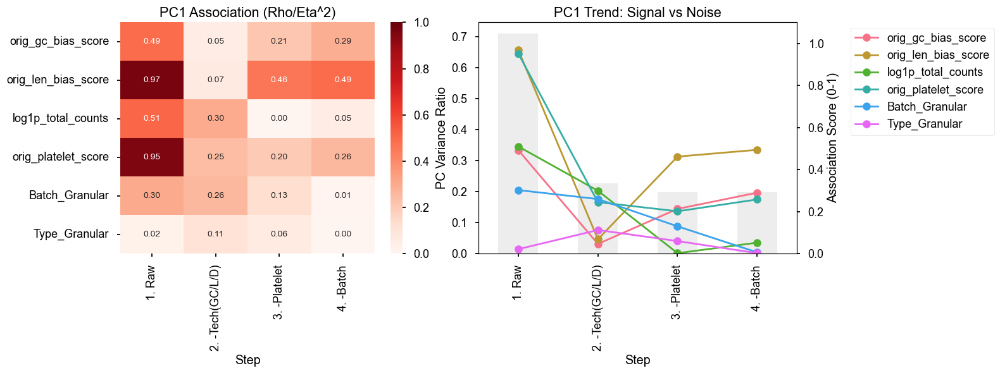


  >>> Analyzing Method: log_TPM
--- [Switching Layer] Using: log_TPM ---
PCA and related metadata reset for layer: log_TPM
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


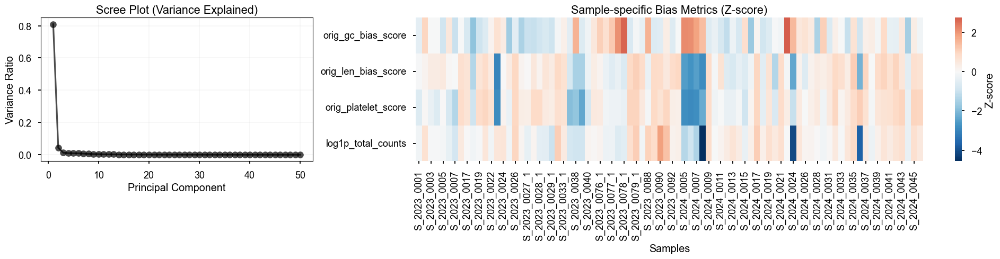

--- [Step 2-2] PCA Scatter Plots ---


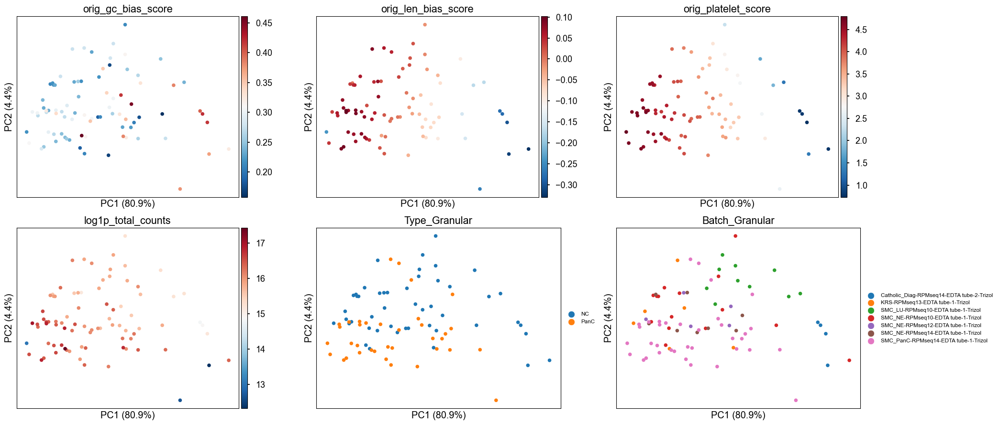

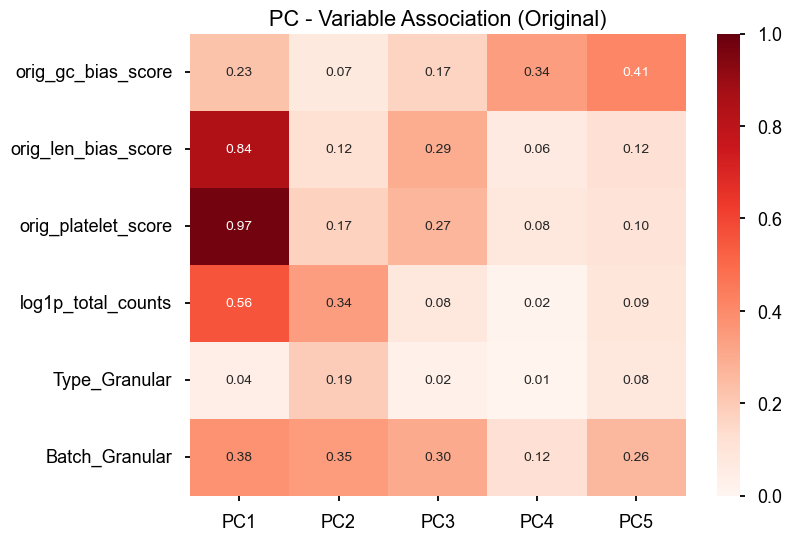

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 127 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


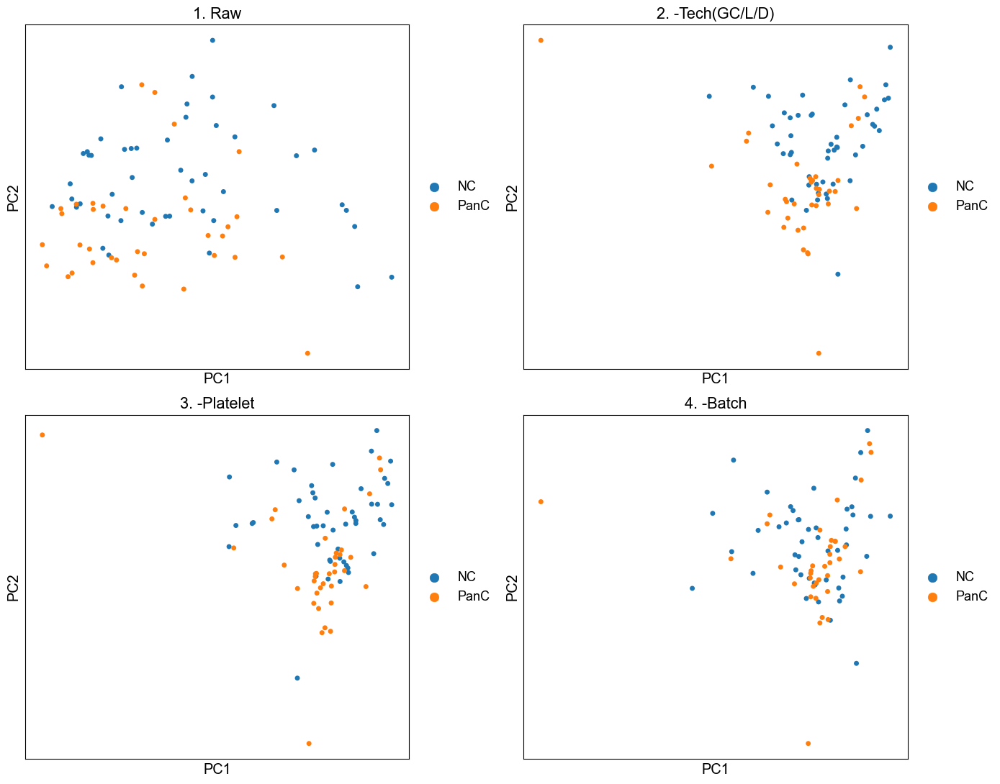

Displaying Metric Evolution (Spearman/ANOVA)...


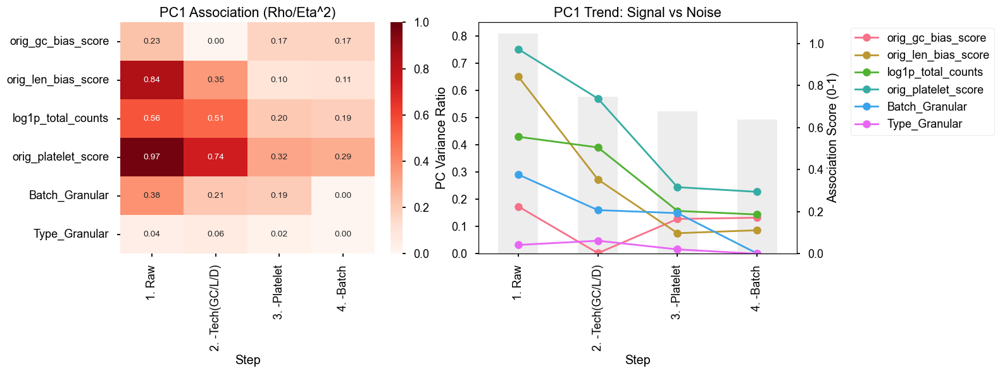


  >>> Analyzing Method: log_FPKM
--- [Switching Layer] Using: log_FPKM ---
PCA and related metadata reset for layer: log_FPKM
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


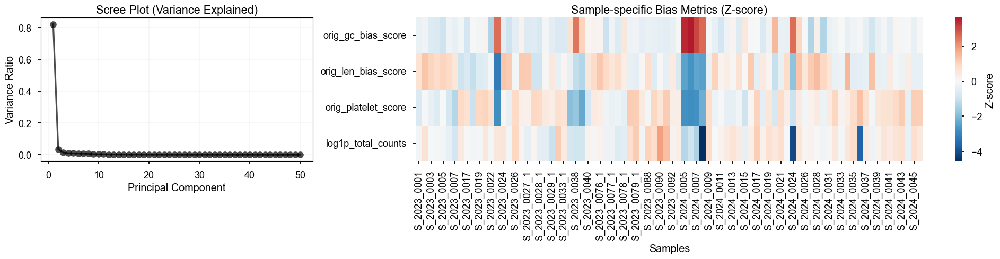

--- [Step 2-2] PCA Scatter Plots ---


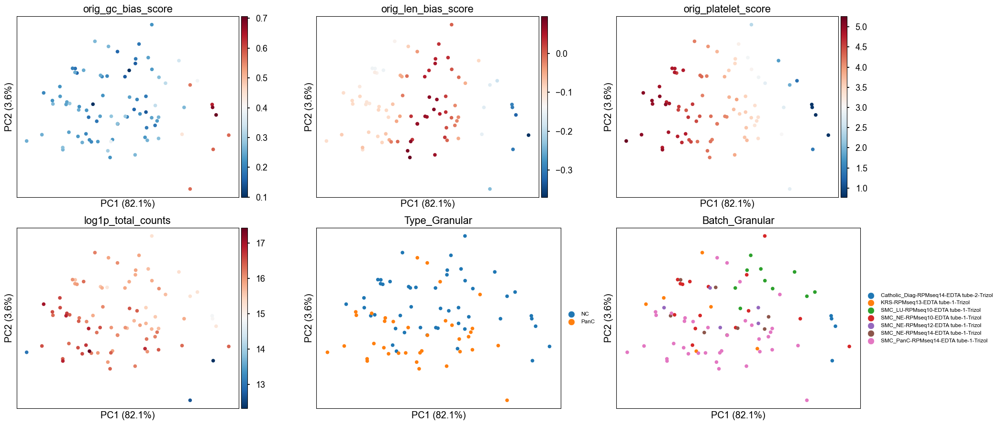

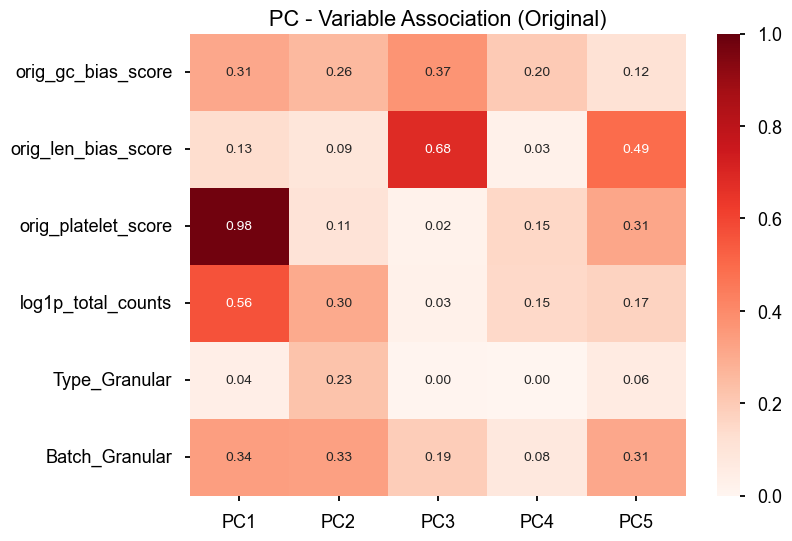

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


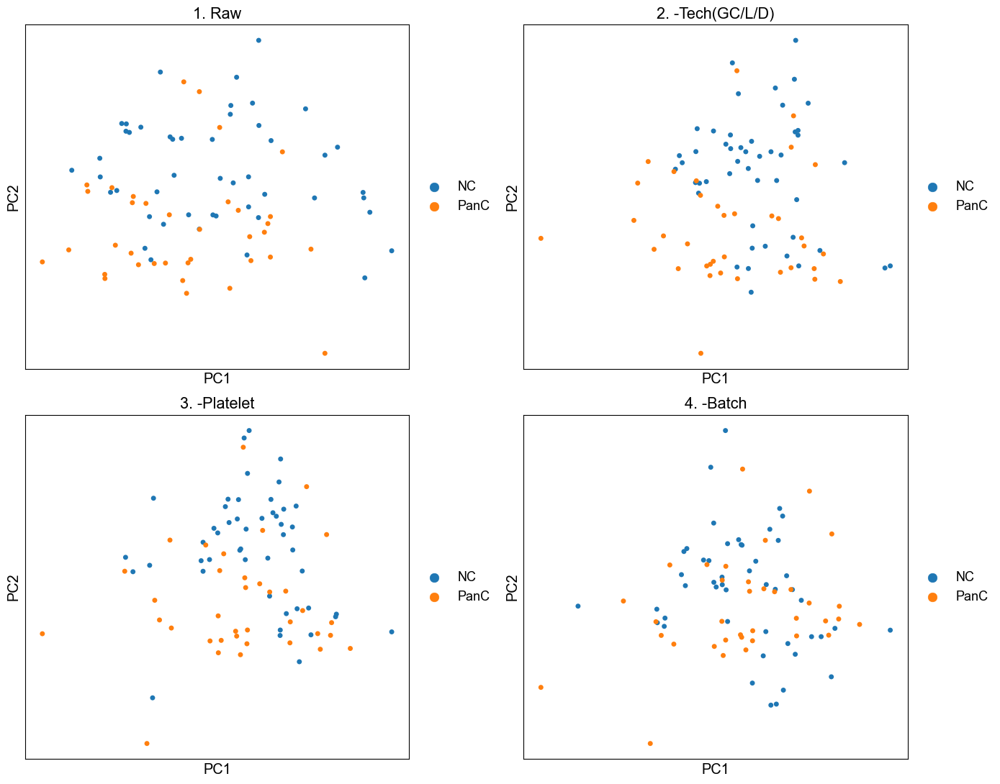

Displaying Metric Evolution (Spearman/ANOVA)...


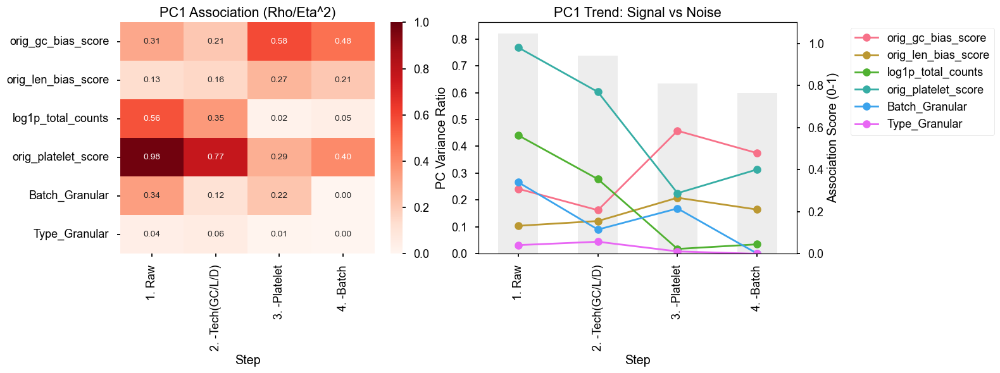


  >>> Analyzing Method: EDA_GC
--- [Switching Layer] Using: EDA_GC ---
PCA and related metadata reset for layer: EDA_GC
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


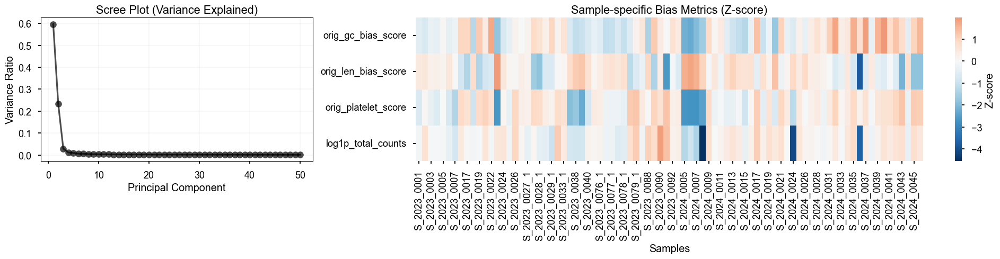

--- [Step 2-2] PCA Scatter Plots ---


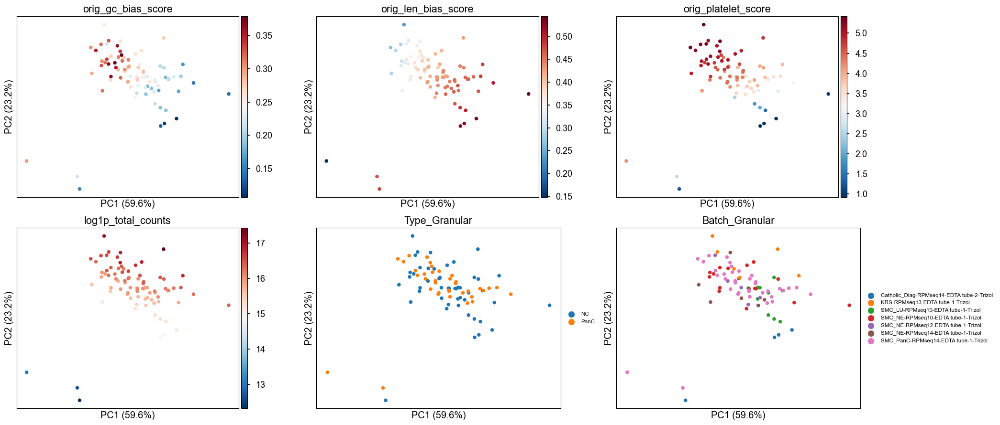

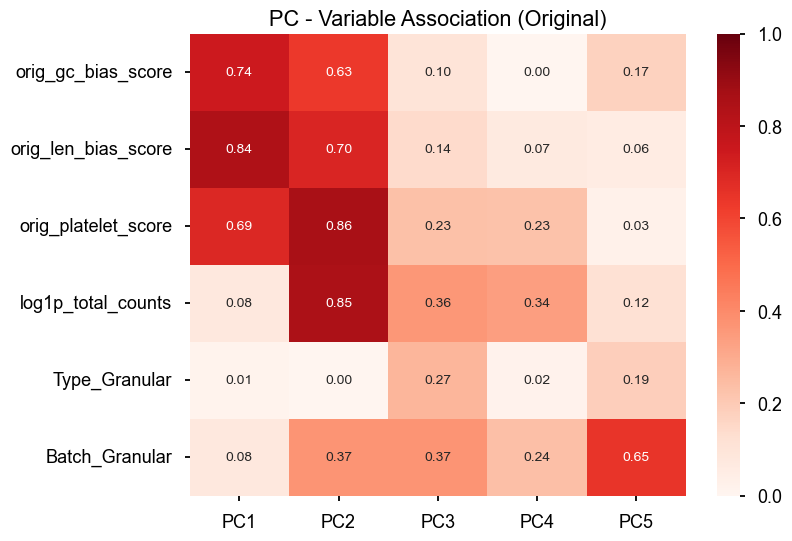

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 73 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


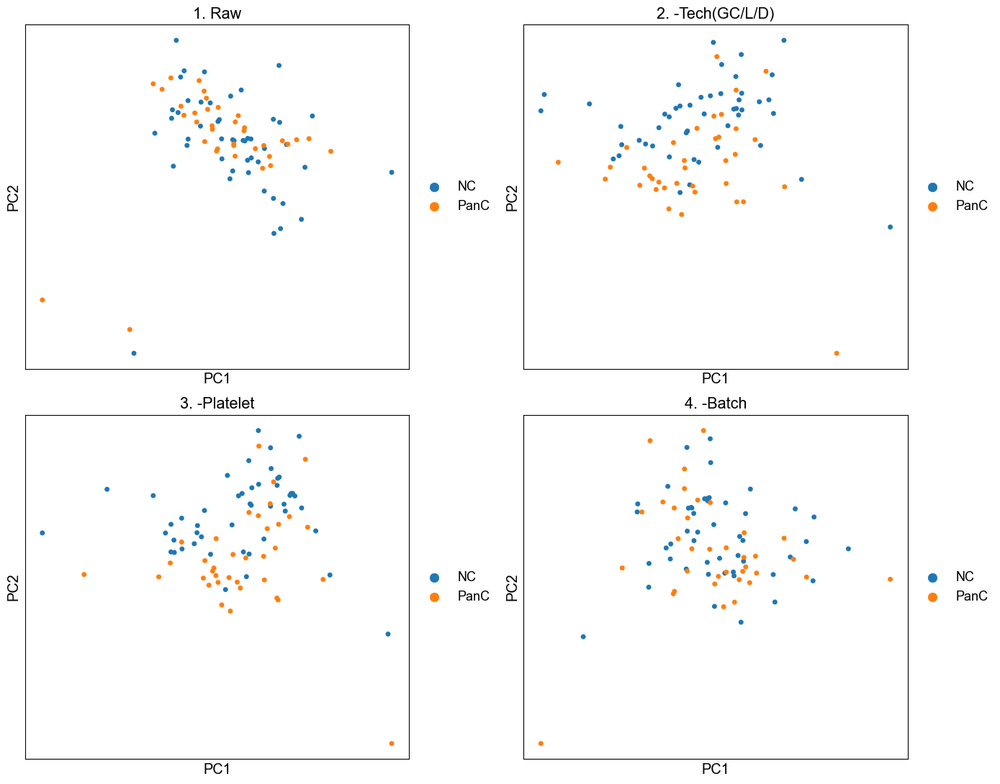

Displaying Metric Evolution (Spearman/ANOVA)...


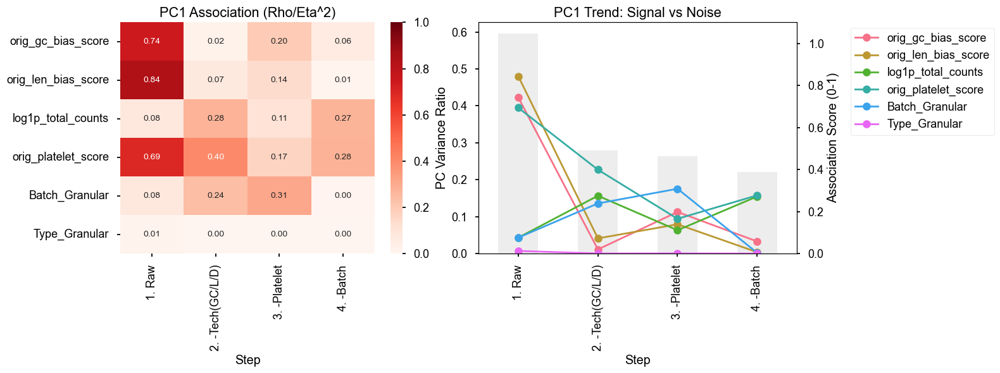


  >>> Analyzing Method: EDA_Length
--- [Switching Layer] Using: EDA_Length ---
PCA and related metadata reset for layer: EDA_Length
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


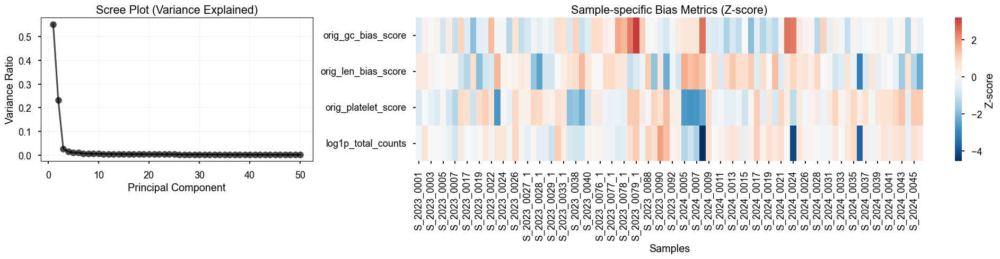

--- [Step 2-2] PCA Scatter Plots ---


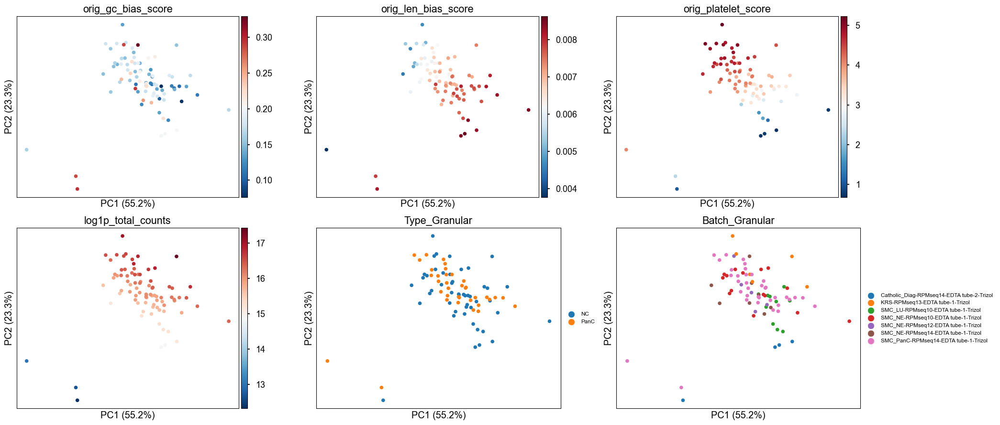

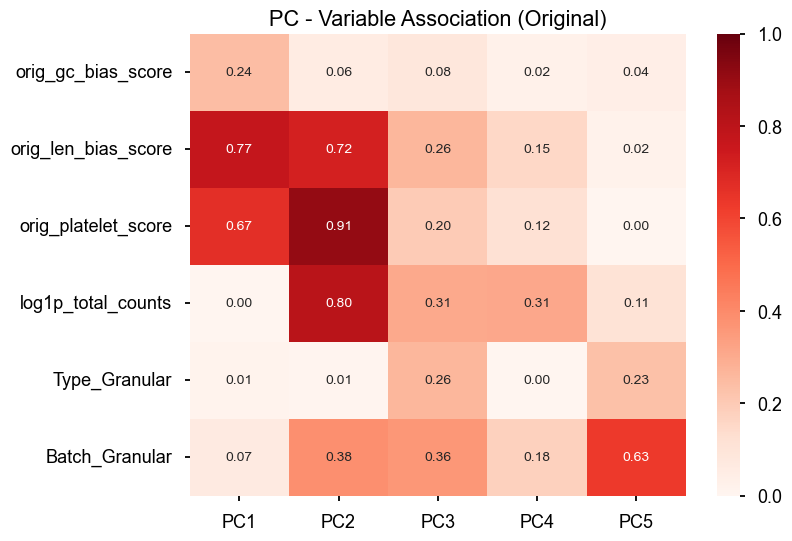

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 15 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


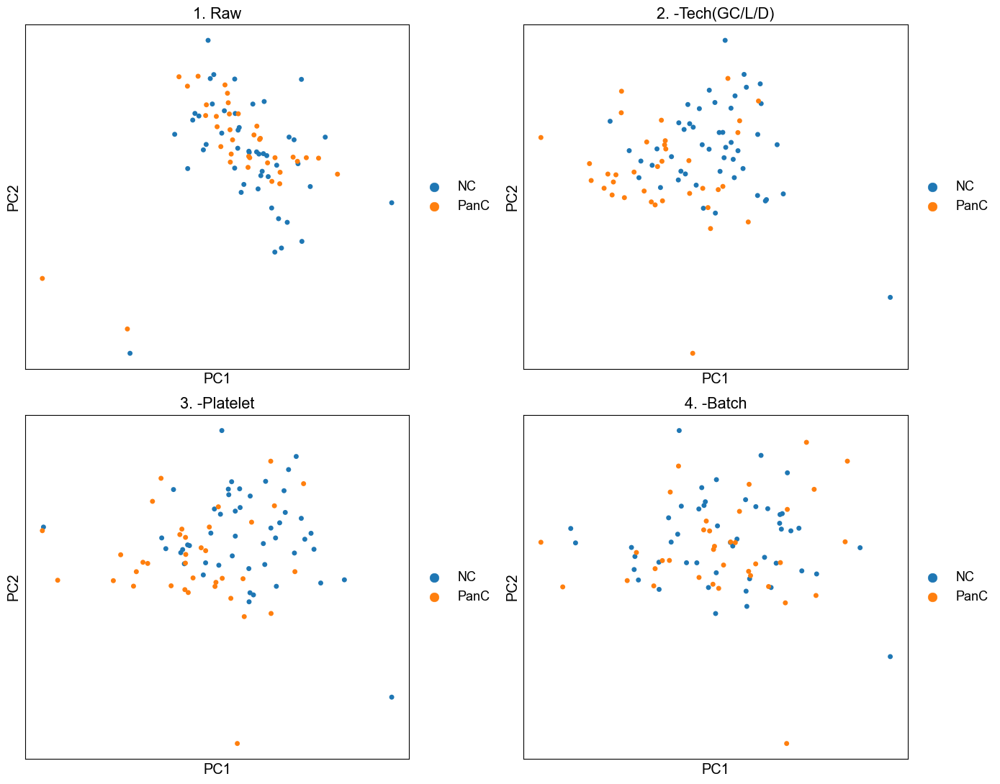

Displaying Metric Evolution (Spearman/ANOVA)...


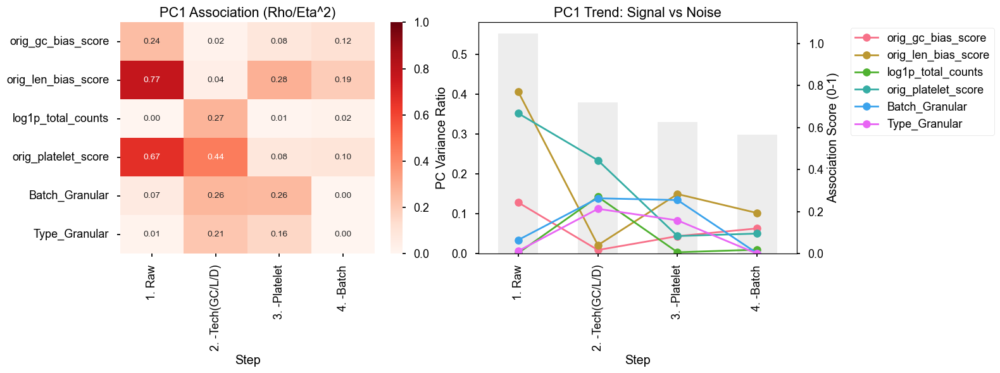


  >>> Analyzing Method: EDA_Within_Scale
--- [Switching Layer] Using: EDA_Within_Scale ---
PCA and related metadata reset for layer: EDA_Within_Scale
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


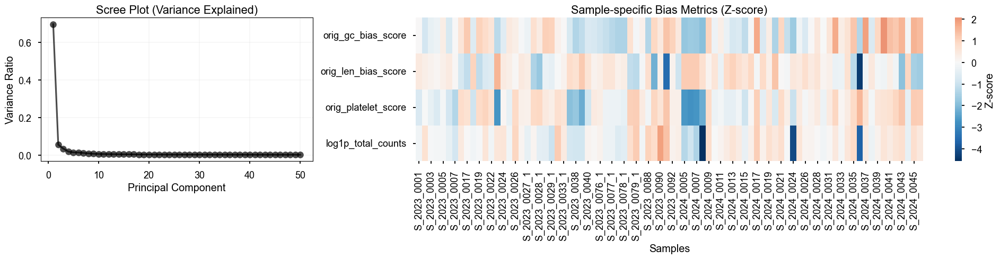

--- [Step 2-2] PCA Scatter Plots ---


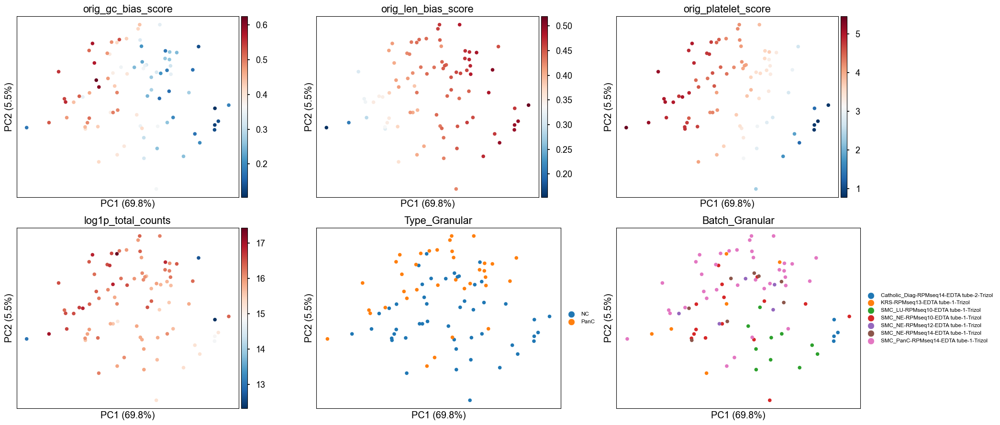

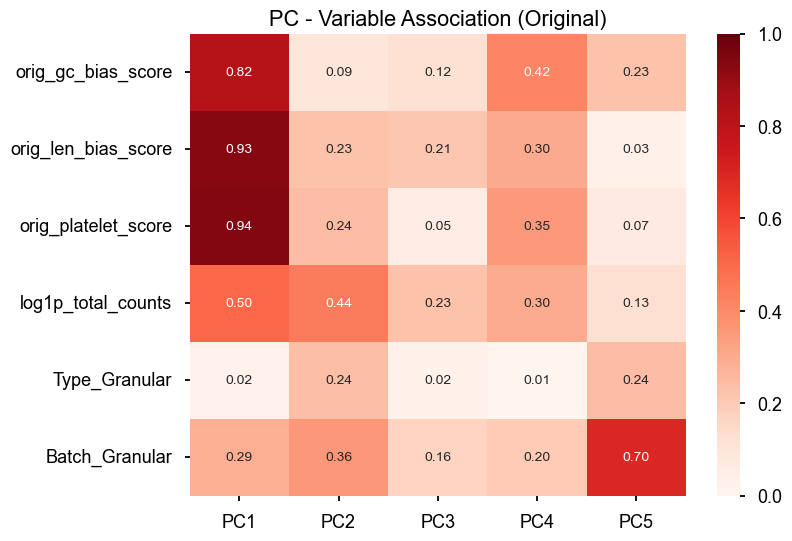

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 207 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


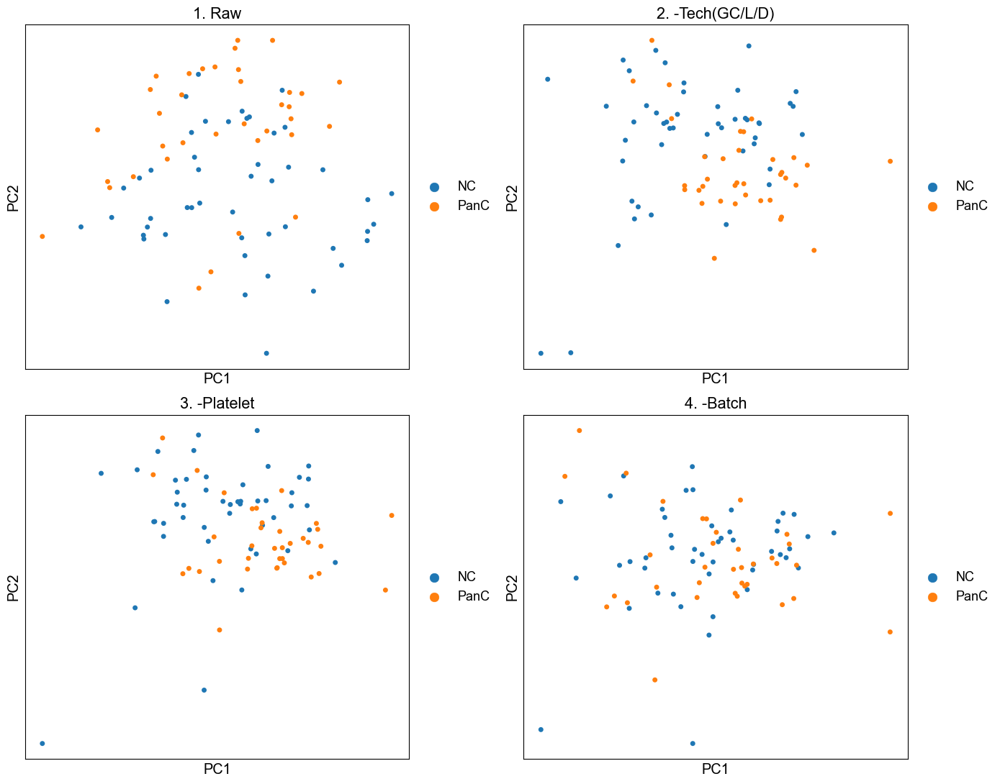

Displaying Metric Evolution (Spearman/ANOVA)...


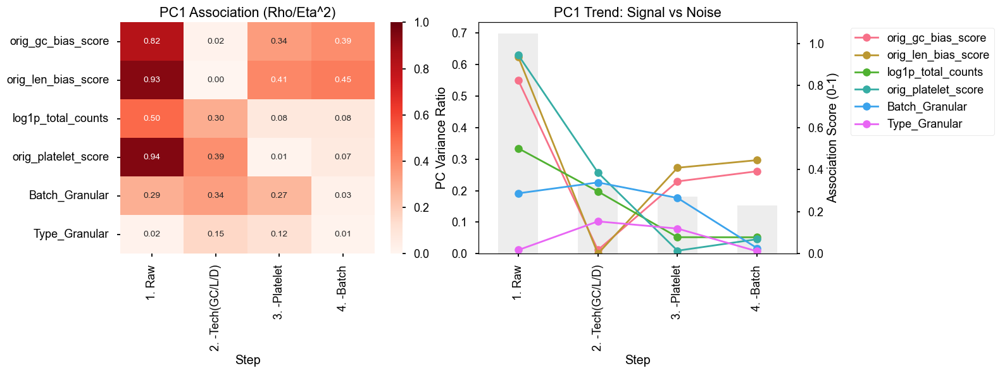


  >>> Analyzing Method: EDA_Within_Full
--- [Switching Layer] Using: EDA_Within_Full ---
PCA and related metadata reset for layer: EDA_Within_Full
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


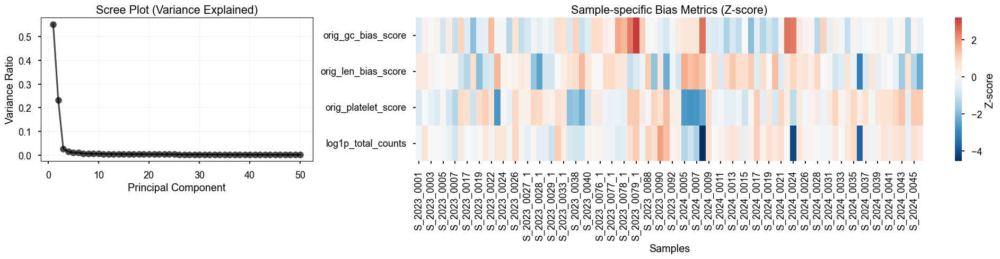

--- [Step 2-2] PCA Scatter Plots ---


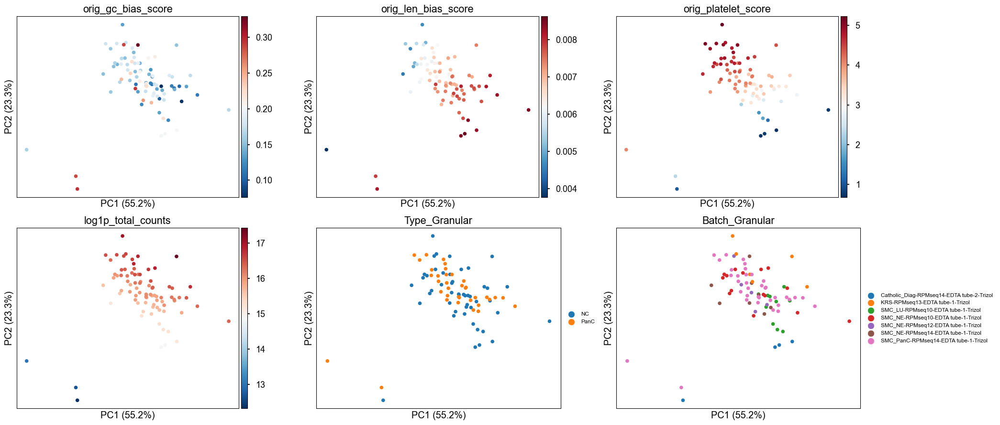

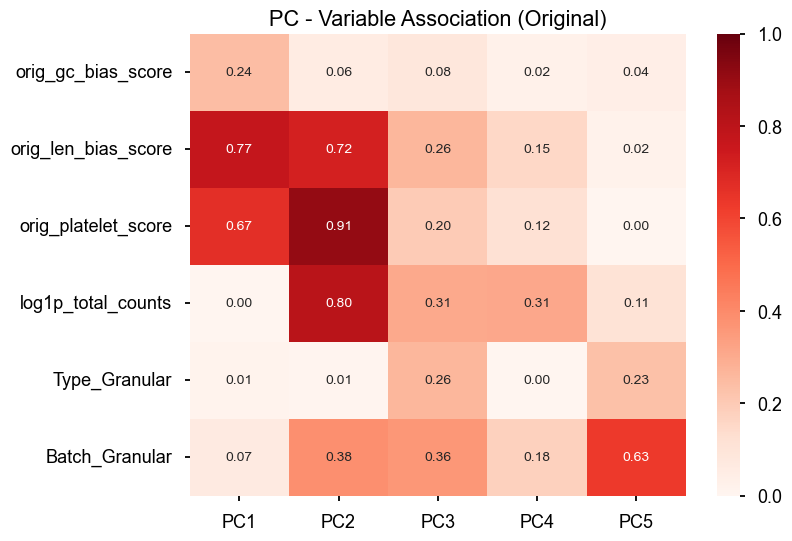

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 15 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


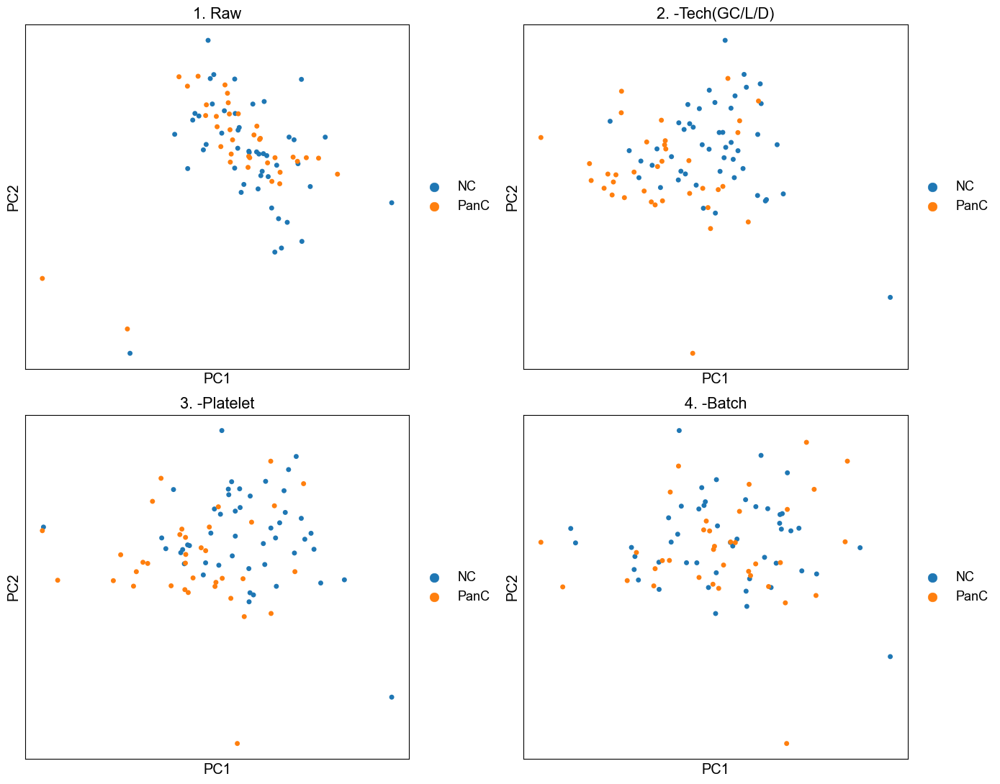

Displaying Metric Evolution (Spearman/ANOVA)...


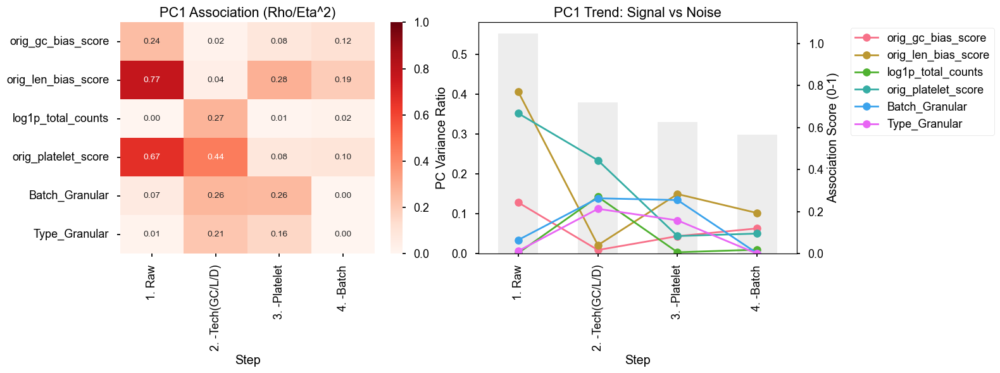


  >>> Analyzing Method: EDA+RUVg_k1
--- [Switching Layer] Using: EDA+RUVg_k1 ---
PCA and related metadata reset for layer: EDA+RUVg_k1
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


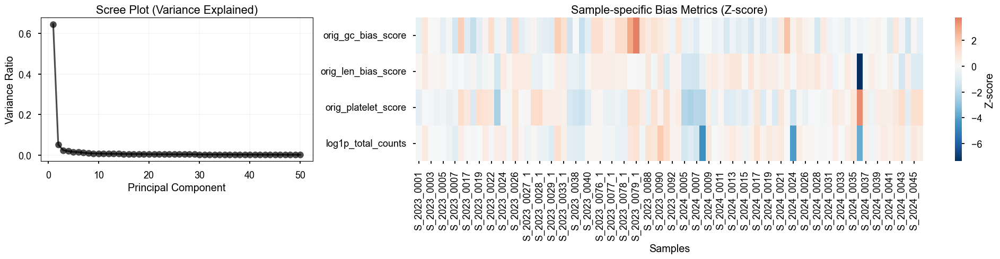

--- [Step 2-2] PCA Scatter Plots ---


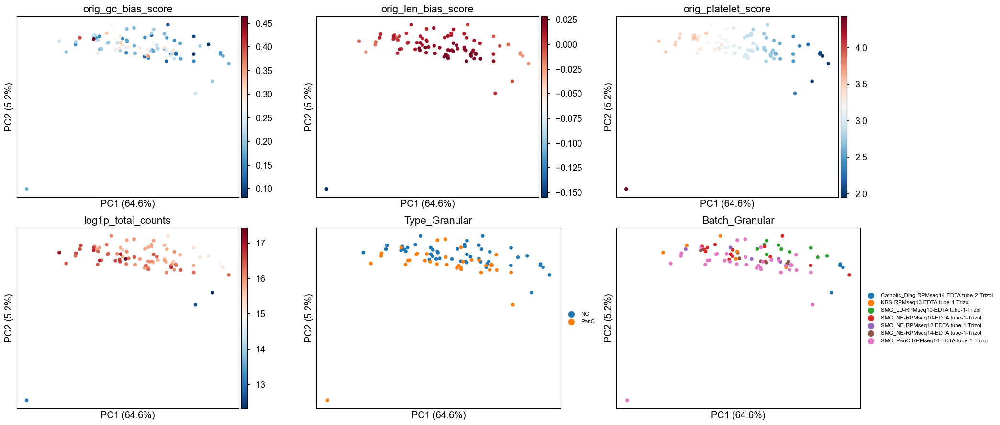

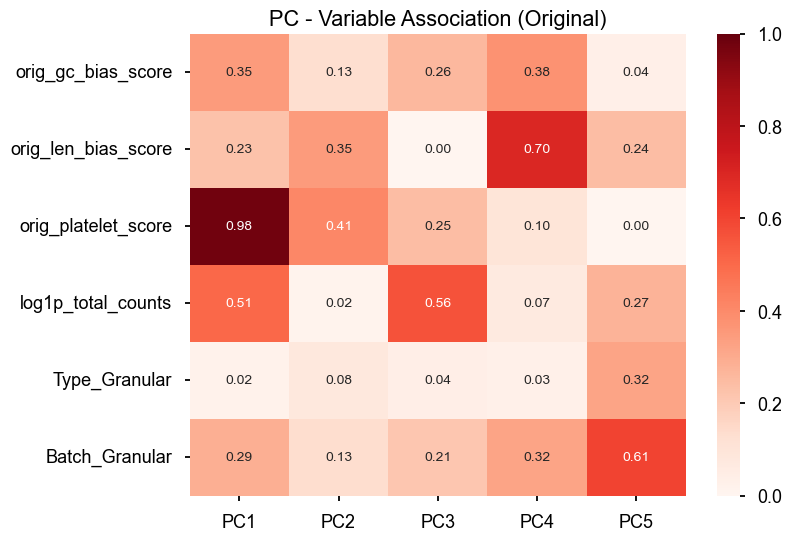

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 11 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


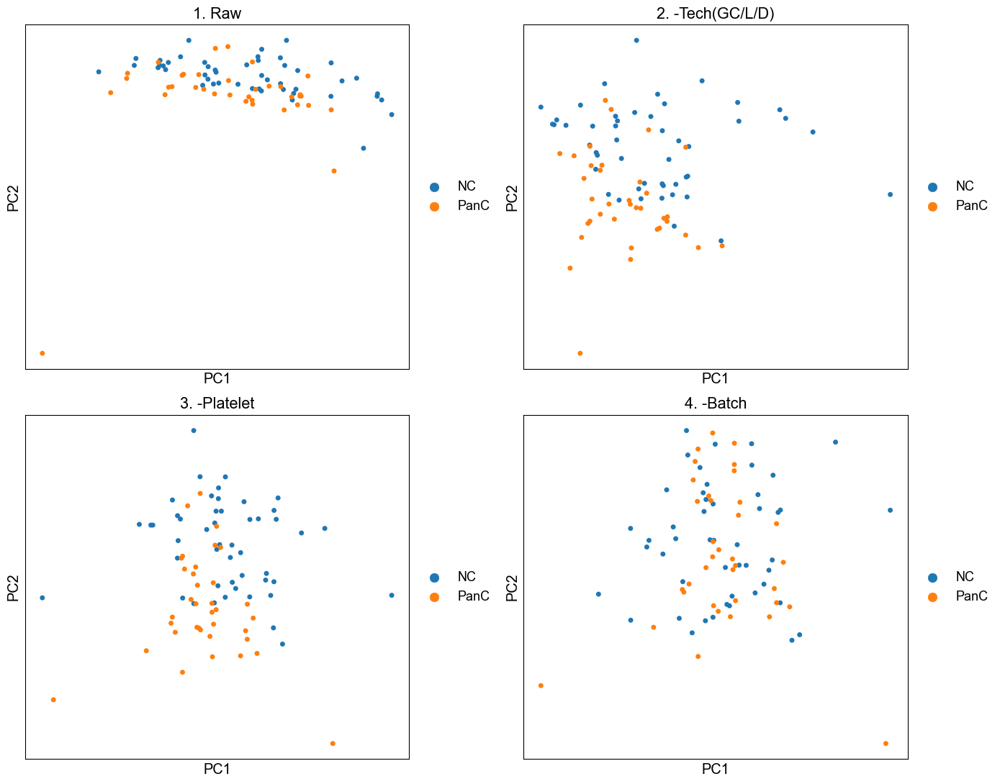

Displaying Metric Evolution (Spearman/ANOVA)...


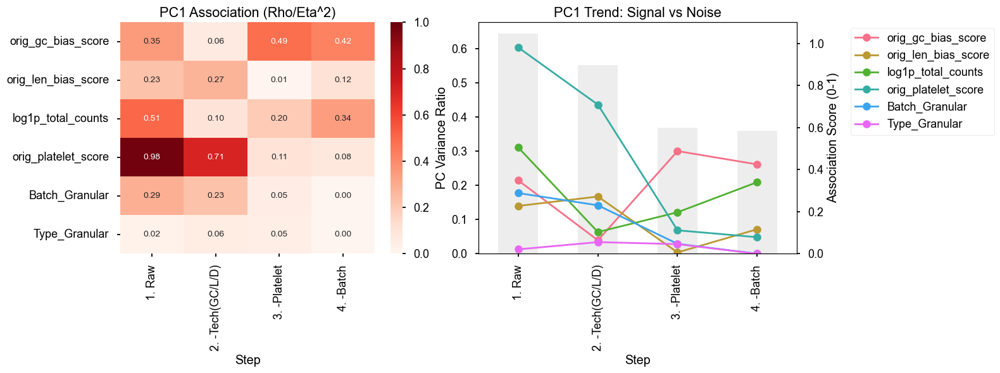


  >>> Analyzing Method: EDA+RUVg_k2
--- [Switching Layer] Using: EDA+RUVg_k2 ---
PCA and related metadata reset for layer: EDA+RUVg_k2
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


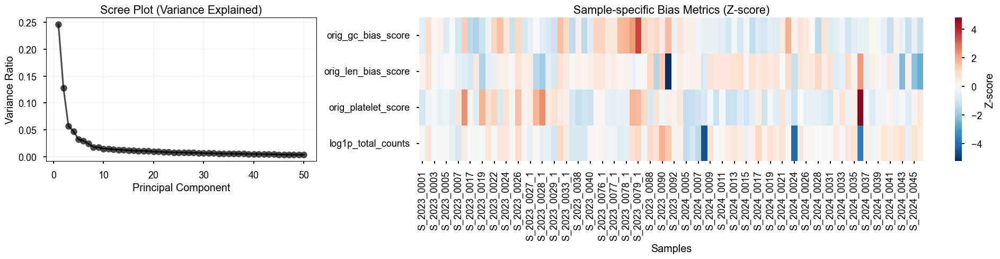

--- [Step 2-2] PCA Scatter Plots ---


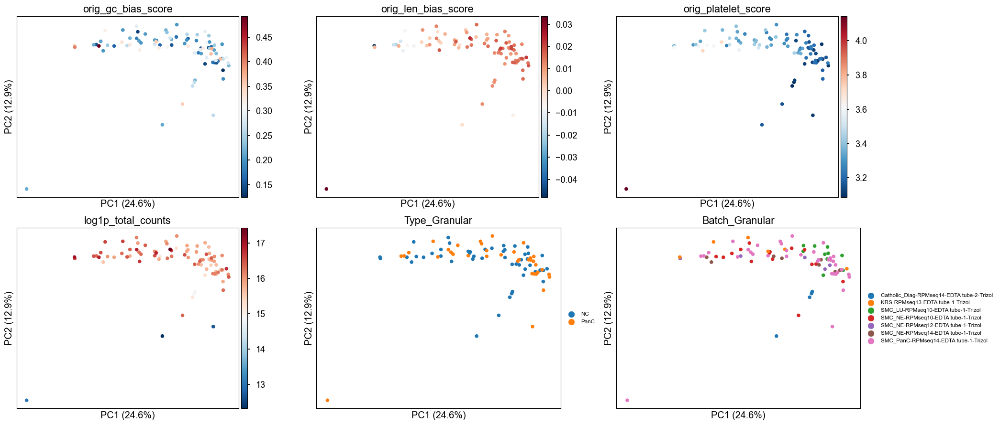

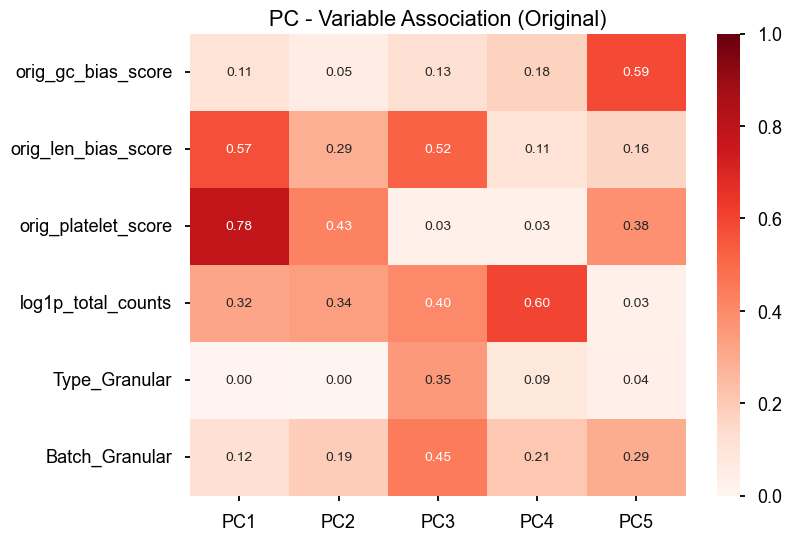

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 11 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


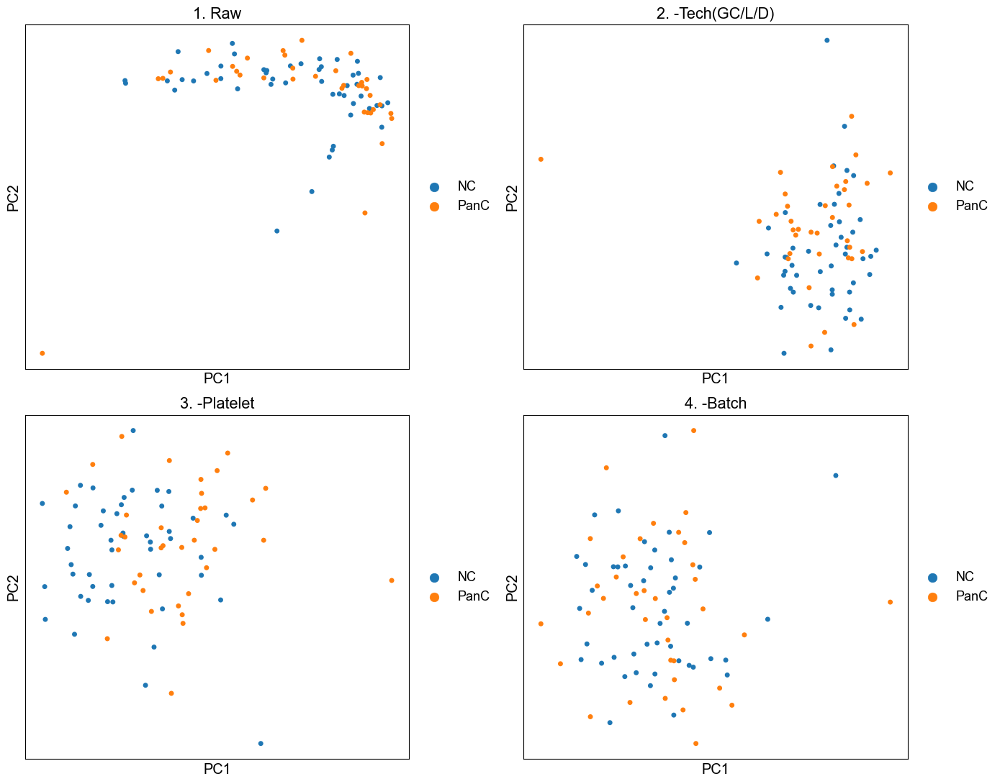

Displaying Metric Evolution (Spearman/ANOVA)...


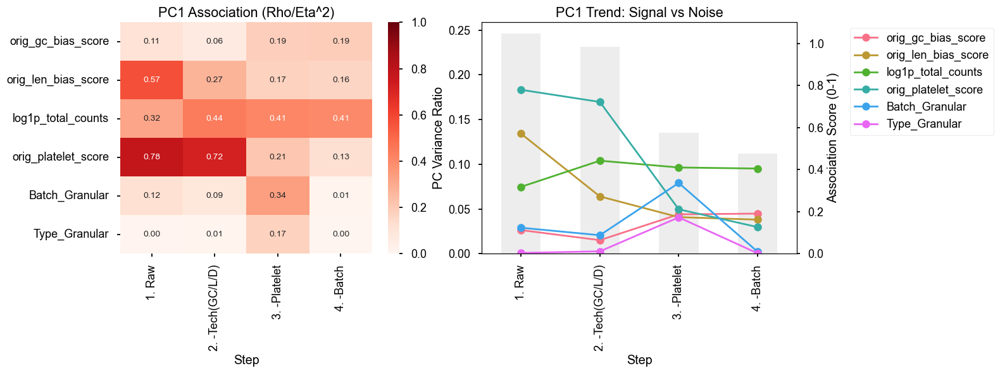


  >>> Analyzing Method: EDA+RUVg_k3
--- [Switching Layer] Using: EDA+RUVg_k3 ---
PCA and related metadata reset for layer: EDA+RUVg_k3
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


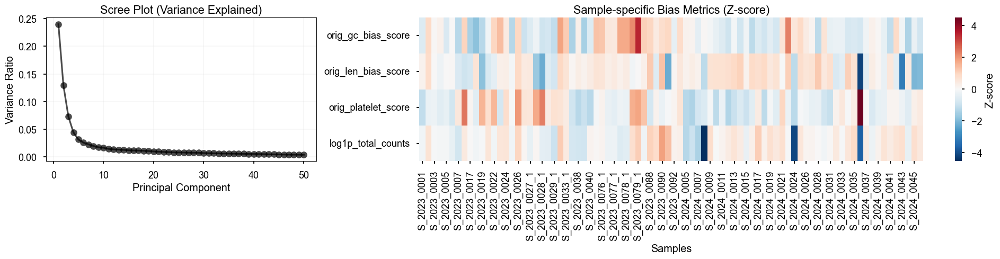

--- [Step 2-2] PCA Scatter Plots ---


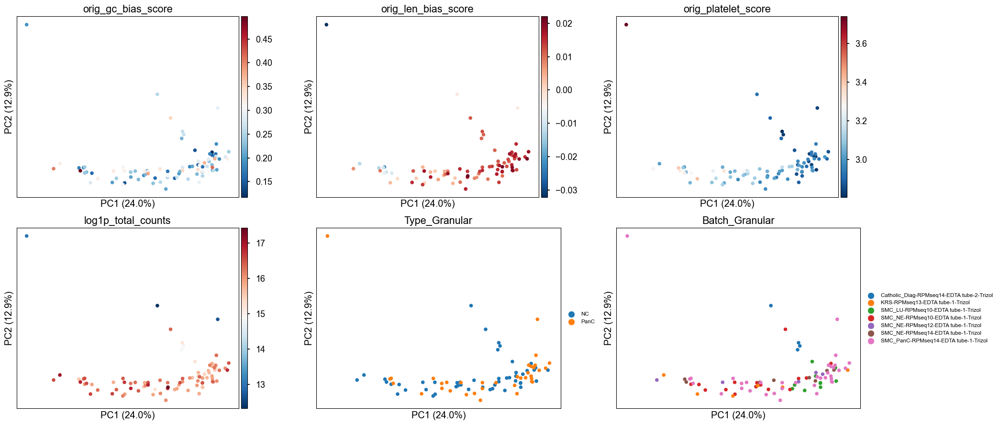

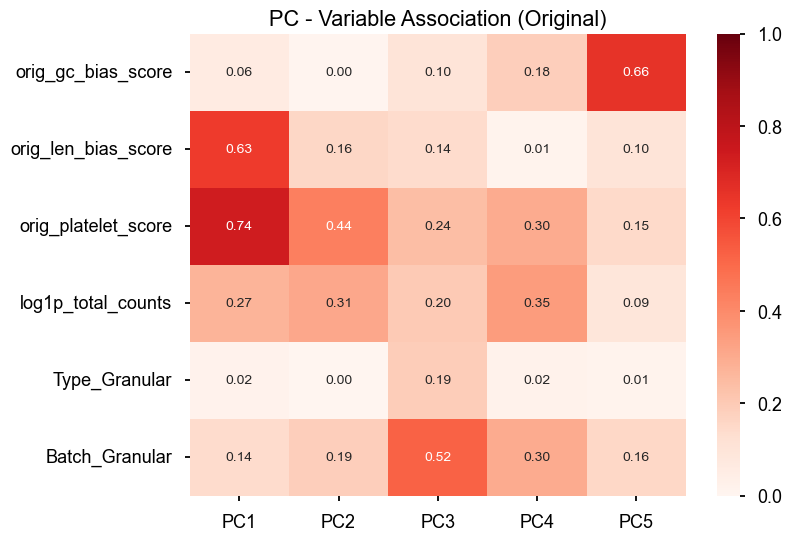

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'
Found 11 genes with zero variance.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: invalid value encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:343: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


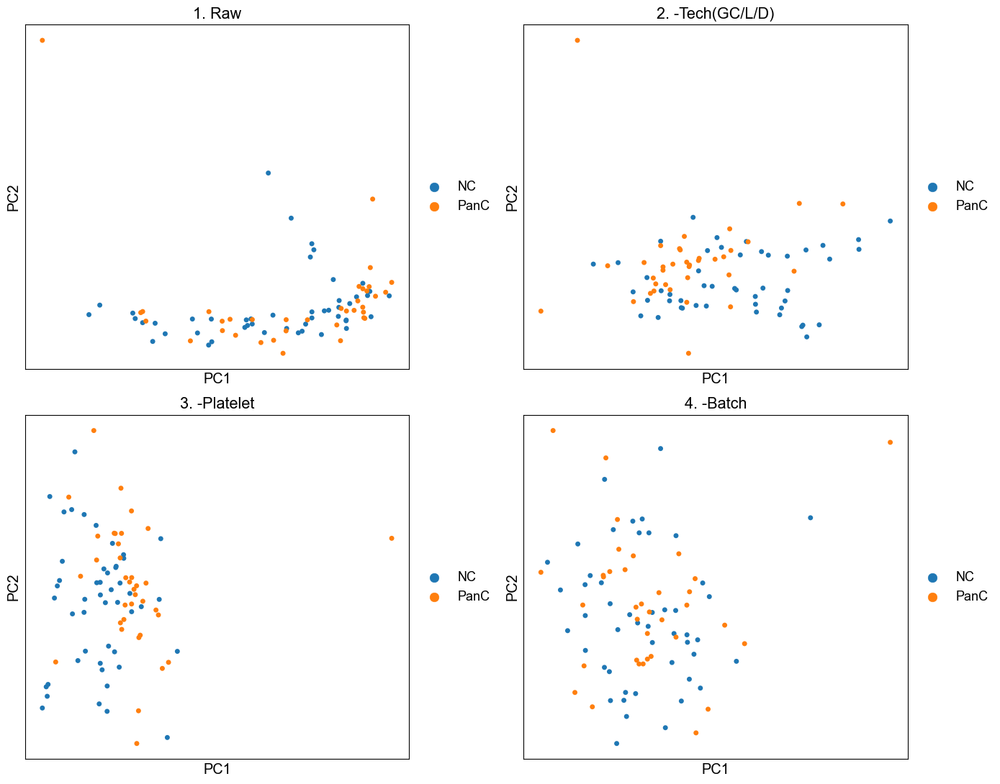

Displaying Metric Evolution (Spearman/ANOVA)...


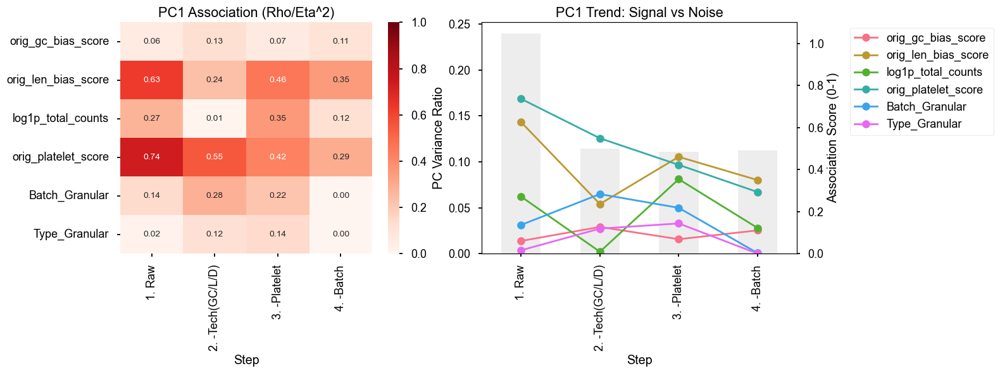


  >>> Analyzing Method: RUVg_k1
--- [Switching Layer] Using: RUVg_k1 ---
PCA and related metadata reset for layer: RUVg_k1
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


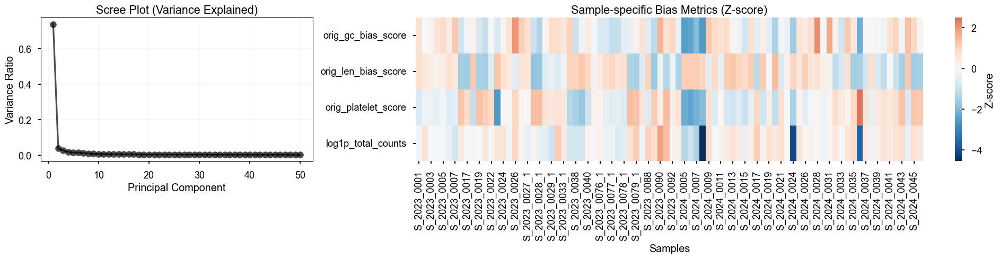

--- [Step 2-2] PCA Scatter Plots ---


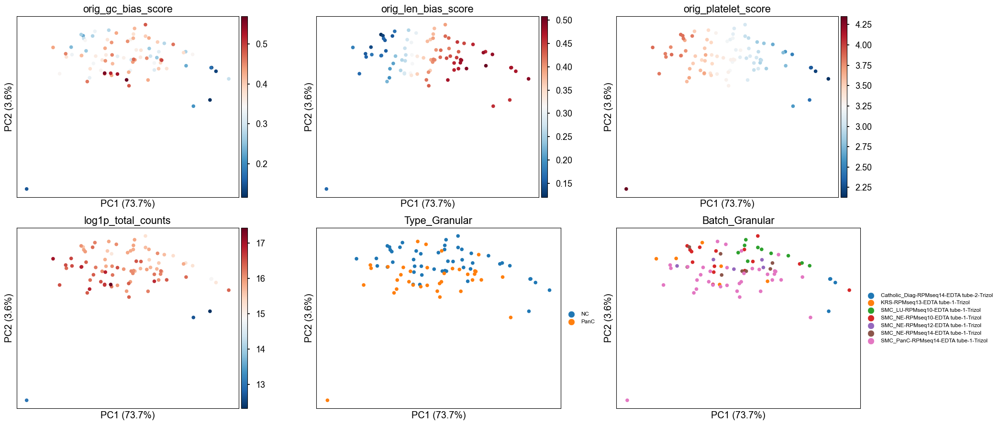

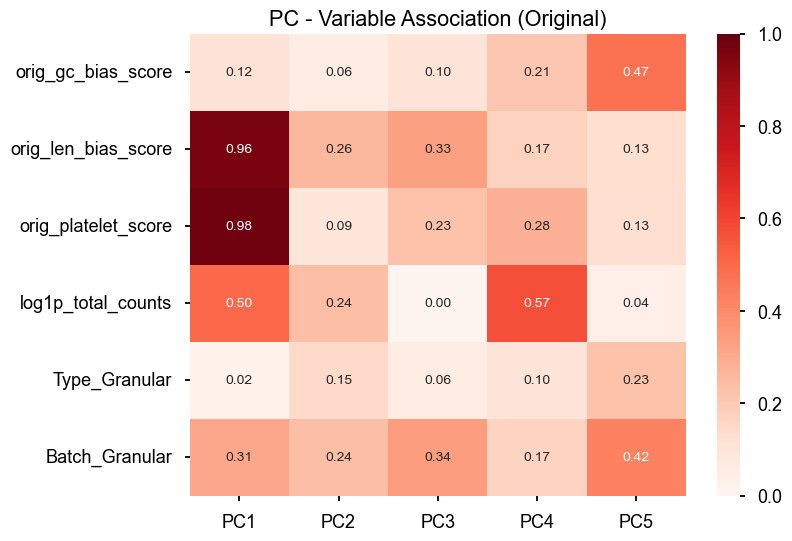

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


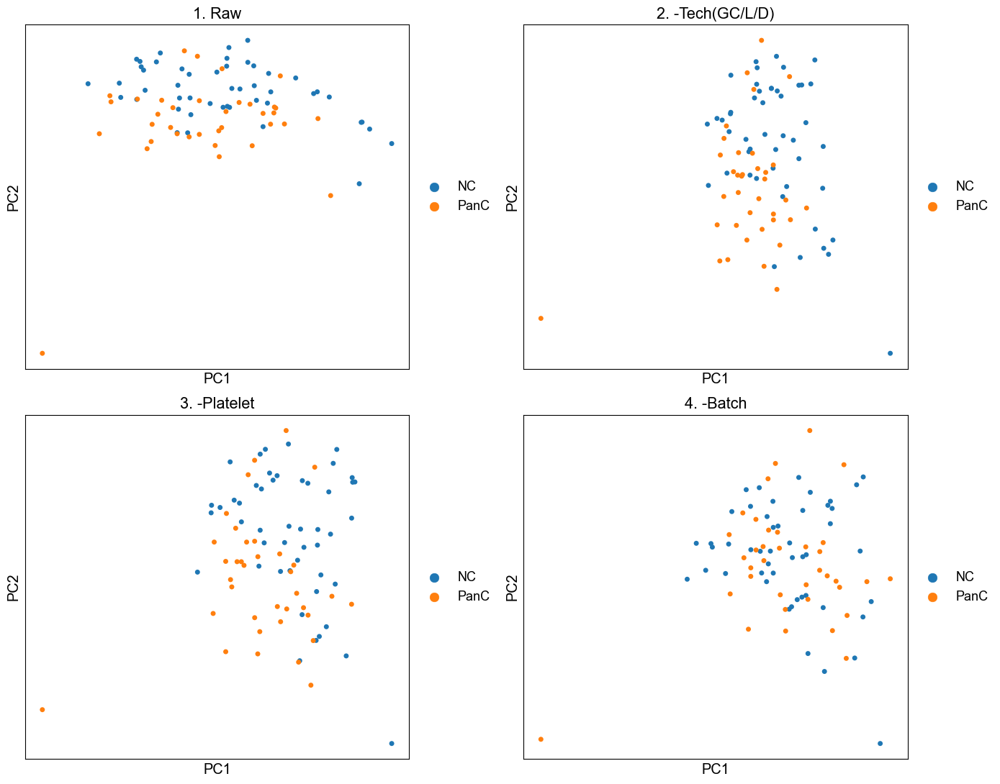

Displaying Metric Evolution (Spearman/ANOVA)...


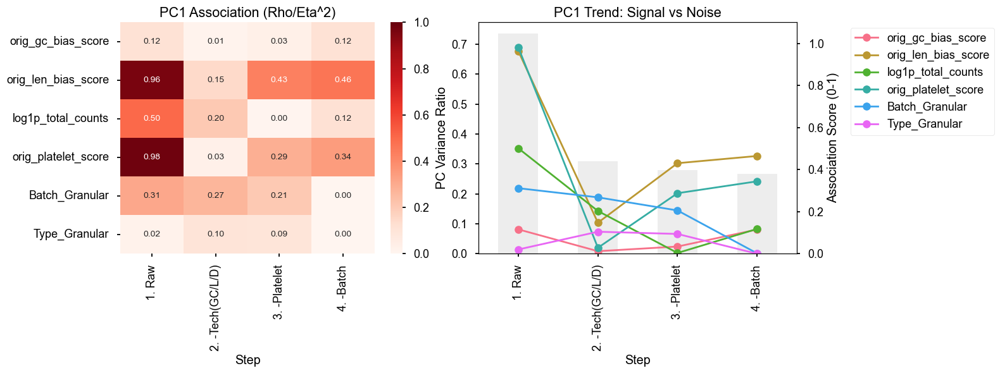


  >>> Analyzing Method: RUVg_k2
--- [Switching Layer] Using: RUVg_k2 ---
PCA and related metadata reset for layer: RUVg_k2
--- [Step] Calculating Original Bias Metrics ---
  > Computing GC bias using LOESS...
  > Computing Length bias using Spearman...
  > Computing Platelet gene scores...
Done: Original metrics saved with prefix 'orig_'.
--- [Step 2-1] Scree Plot & Bias Heatmap ---


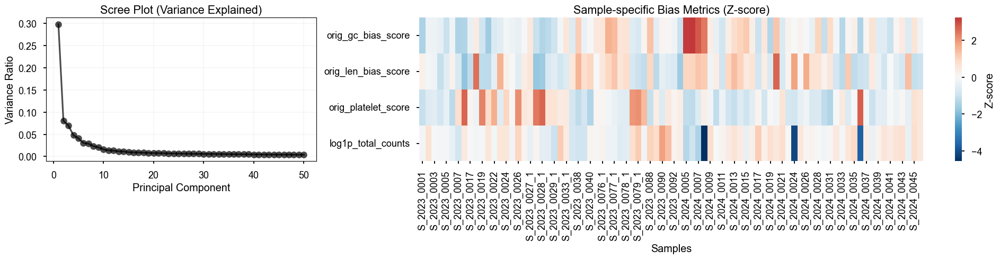

--- [Step 2-2] PCA Scatter Plots ---


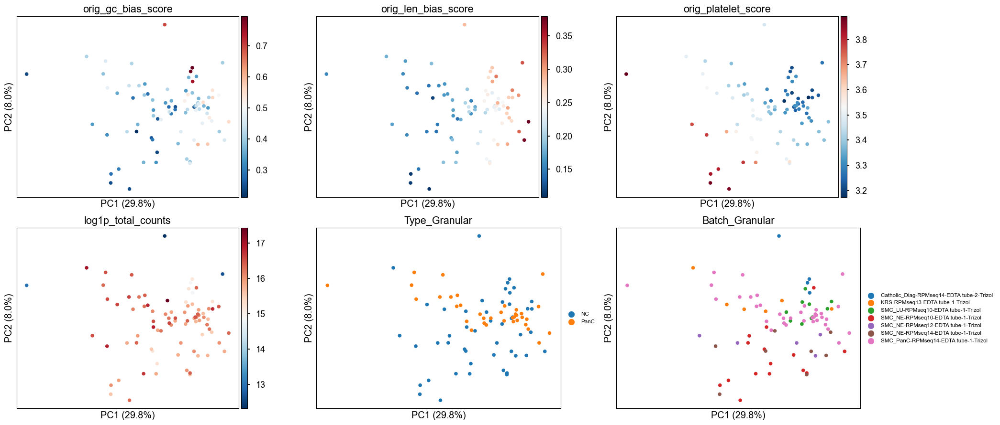

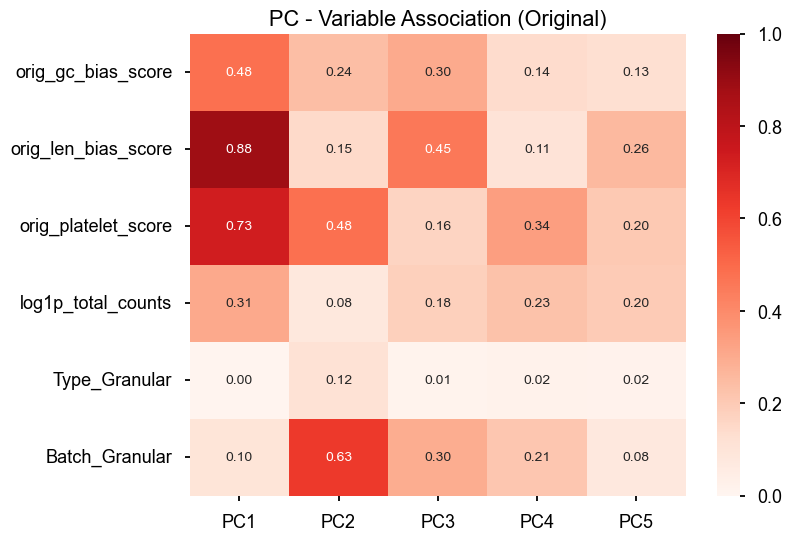

--- [Step 8] Cascade Correction Analysis (Batch Method: COMBAT) ---
   -> Regressing out: ['orig_gc_bias_score', 'orig_len_bias_score', 'log1p_total_counts']
   -> Regressing out: ['orig_platelet_score']
   -> Applying ComBat on 'Batch_Granular'


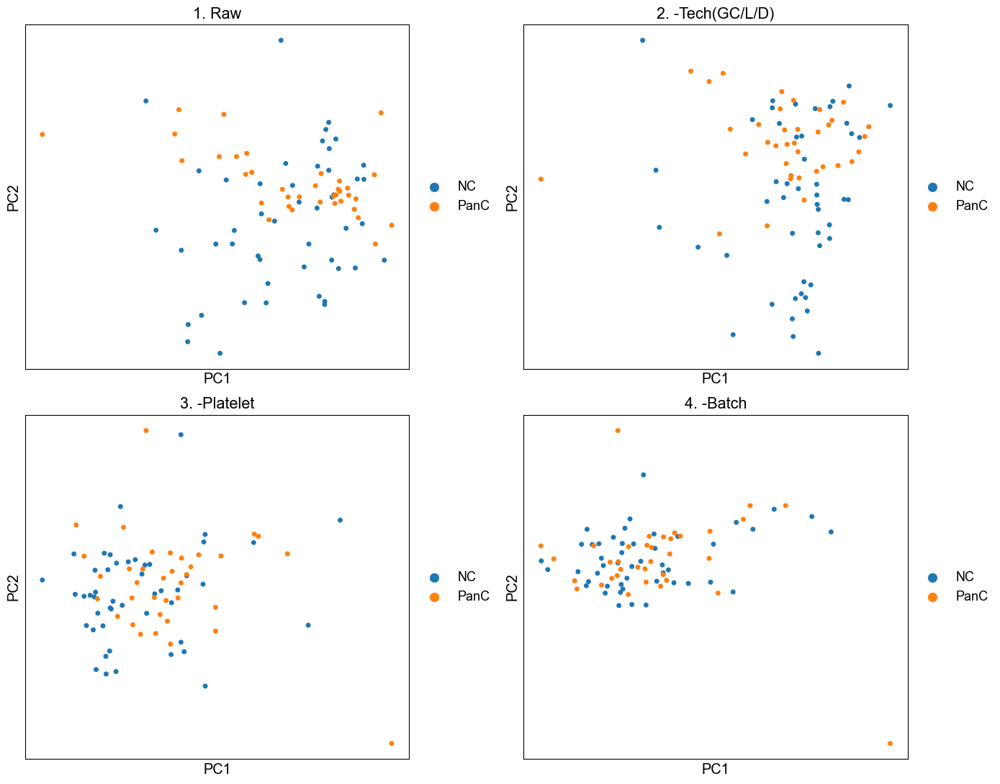

Displaying Metric Evolution (Spearman/ANOVA)...


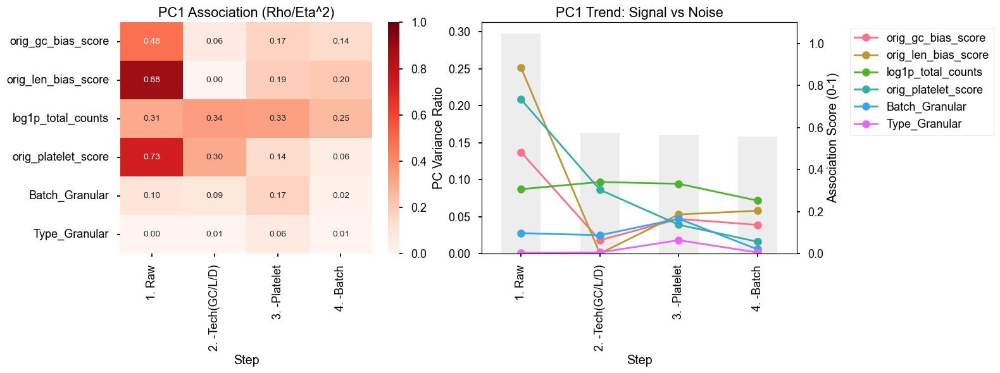


  >>> Analyzing Method: RUVg_k3


ValueError: Layer 'RUVg_k3' not found in AnnData.

In [32]:
pipeline = RNASeqQCPipeline(
    adata_sub, 
    gene_type_col='GeneType',       # 유전자 타입 컬럼
    target_types=['protein_coding'],# 분석 대상
    phenotype_col='Type_Granular',  # 주 관심사 (질병/정상 등)
    batch_col='Batch_Granular',     # 배치 정보
    gc_col='GC_Percent',            # 유전자 GC 함량
    len_col='Length',               # 유전자 길이
    platelet_col='is_platelet'      # 혈소판 마커 여부 컬럼
)

pipeline.prepare_data()
comparison_layers = list(norm_files.keys())
print(f"Start Benchmarking across {len(comparison_layers)} methods...\n")

for layer in comparison_layers:
    if layer not in adata.layers:
        print(f"Skipping {layer}: Layer not found.")
        continue
        
    print(f"\n{'='*60}")
    print(f"  >>> Analyzing Method: {layer}")
    print(f"{'='*60}")
    pipeline.set_layer(layer)
    pipeline.calculate_bias_metrics(is_original=True)
    pipeline.run_pca_diagnostics(use_original_metrics=True)
    pipeline.analyze_pc_associations(n_pcs=5, use_original_metrics=True)
    pipeline.run_cascade_analysis(use_original_metrics=True, batch_method='combat')
    
print("\nBenchmarking Complete.")